# Intro: Beyond Matplotlib

* Matplotlib is great and by far the most versatile library (and the basis for all of these!), but there are situations where its annyoing
* sometimes, you just want to create plots with one command
* sometimes you want to add statistics without boilerplate code
* sometimes you want interactive stuff stuff

In [ ]:
#make sure to install these requirements
#see also https://altair-viz.github.io/user_guide/troubleshooting.html#jupyterlab-vegalite-3-object

In [2]:
import vega_datasets
cars = vega_datasets.data.cars()
cars = cars.fillna(cars.median())
cars.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [3]:
import seaborn as sns
import pandas as pd
titanic = pd.read_csv('titanic.csv')
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


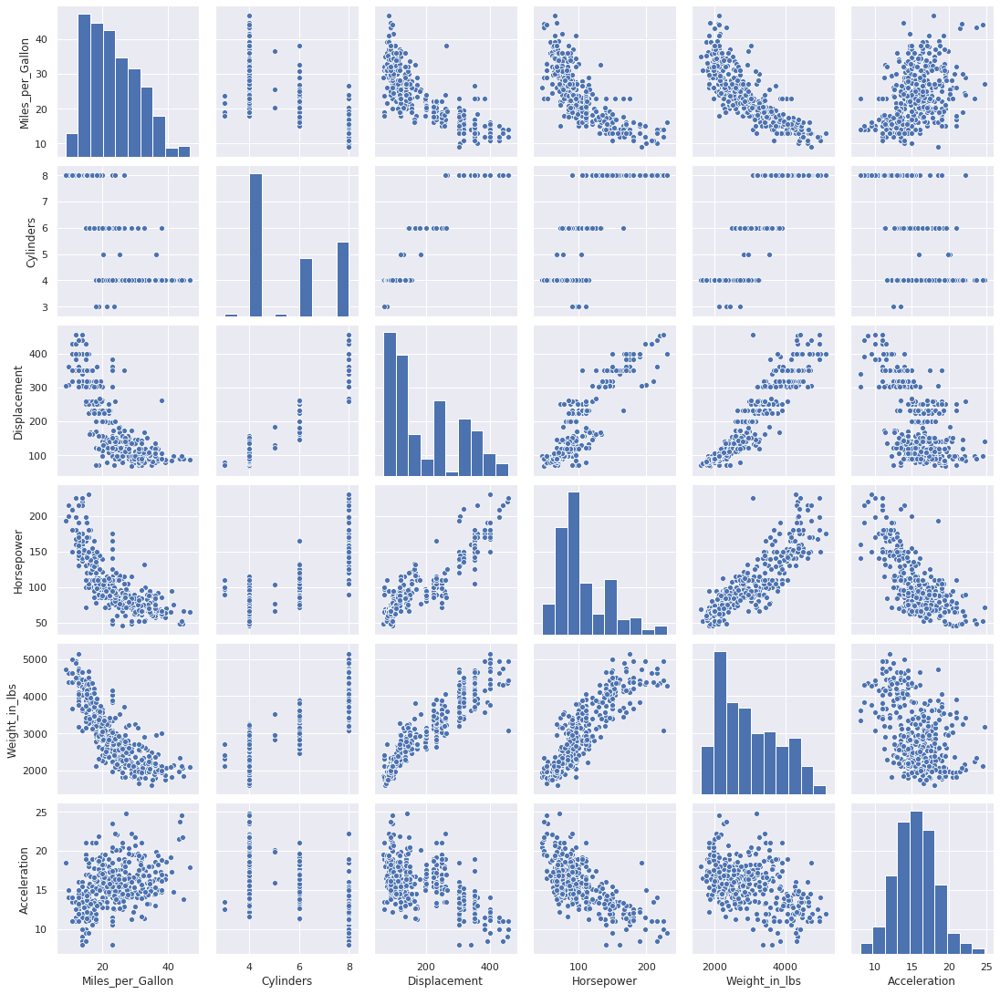

In [4]:
#there are some types of plot that seaborn is just perfect for:
import seaborn as sns
sns.set()
sns.pairplot(cars)

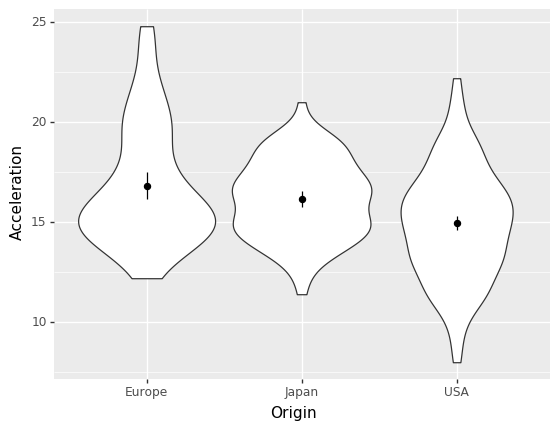

<ggplot: (8773456133703)>

In [5]:
#plotnine follows the grammar of graphics and allows to add components simply by stating their name
from plotnine import *
(ggplot(cars, aes(x='Origin', y='Acceleration')) 
 + geom_violin()
 + stat_summary()
#  + geom_jitter(width=0.2)
)

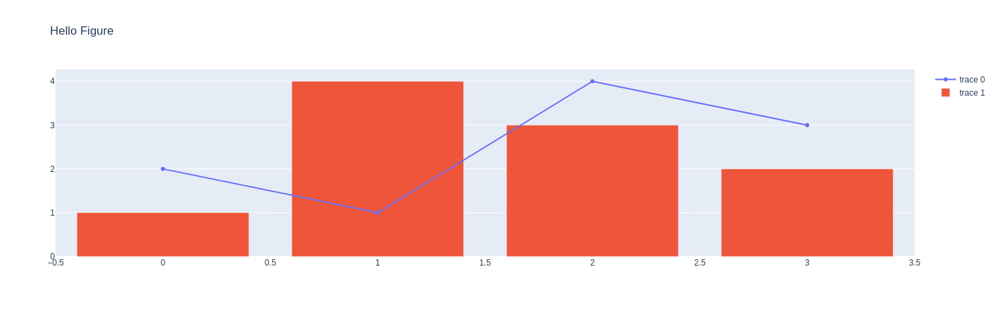

In [163]:
#Some interactive things are easiest in plotly...
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(y=[2, 1, 4, 3]))
fig.add_trace(go.Bar(y=[1, 4, 3, 2]))
fig.update_layout(title = 'Hello Figure')
fig.show()

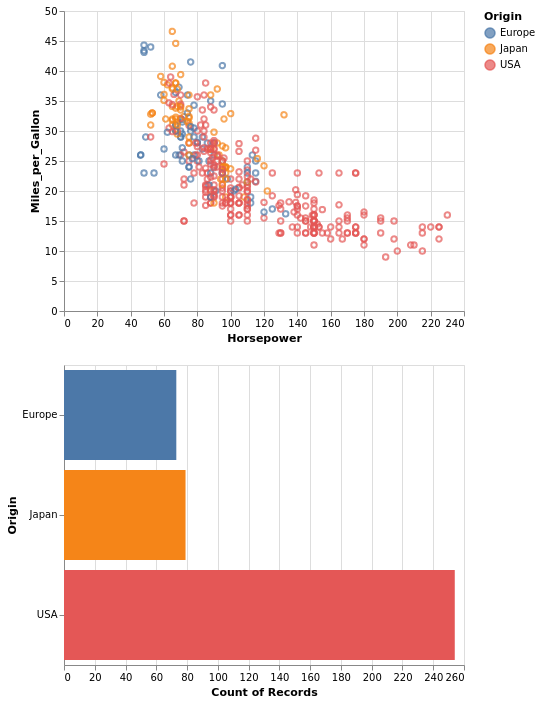

In [6]:
#altair's interactive plots are just the shit
import altair as alt

brush = alt.selection(type='interval')
points = alt.Chart().mark_point().encode(
    x='Horsepower:Q',
    y='Miles_per_Gallon:Q',
    color=alt.condition(brush, 'Origin:N', alt.value('lightgray'))
).add_selection(
    brush
)

bars = alt.Chart().mark_bar().encode(
    y='Origin:N',
    color='Origin:N',
    x='count(Origin):Q'
).transform_filter(
    brush
)

alt.vconcat(points, bars, data=cars)

In [130]:
# explore your data using widgets!
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
def plot_sex_distribution(dataset, agerange):
    dataset = dataset[dataset['Age'].between(agerange[0], agerange[1])]
    (dataset['Sex'].value_counts()/dataset['Sex'].count()).plot(kind='bar')
    
interactive(plot_sex_distribution, dataset=fixed(titanic), agerange=widgets.FloatRangeSlider(min=titanic['Age'].min(), max=titanic['Age'].max()))

interactive(children=(FloatRangeSlider(value=(20.315, 60.105), description='agerange', max=80.0, min=0.42), Ou…

.  

.  

.  

.  

# Our Progress so far..

We have told you...

![](fig/python_is_better.png)  

* Since Pandas, we're dealing with stuff that Python copied from other languages - DataFrames are originally from R
* Also in this and in 2 weeks we're dealing with heavily borrowed syntax from R - but Python can do!
.  

.  

![](fig/path_through_scipy.png)  

* **Scientific Programming** means working with numbers and datasets
    * It also means writing a lot nonlinear and exploratory code, for Experiment Analyses, Data Science, Astronomy, ...
* What we are looking at helps you with just that
    * The Python programming language as foundation for all of our work
    * Jupyterlab as environment for exploratory work with our data (and to write scientific documents)
    * Tools like git and the Debugger to improve your workflow 
    * Numpy and Pandas to handle the data
    * Matplotlib (and today's libraries) to visualize your data and exploratory data analysis
    * Scipy and Statsmodels for statistical analysis
    * Performance Optimization methods if all of this was too slow  
    
.  

.  

![](fig/your_workflow.png)  

## Timeline

![](fig/our_progress.png)  

.  

.  

.  

# Exploratory data anaylsis

**Voyager** is a user interface powered by Vega-Lite that enables rapid data exploration and chart specification. 
Voyager encourages breadth-first exploration, by showing univariate summaries first and then intelligently suggesting the addition of new variables based on effective visual encodings. It is the perfect tool to gain an overview over a new dataset, but is also useful for quickly answering more specific questions.

![](fig/voyager2.png)  

There is also a JupyterLab-Extension, however it cannot be used in JupyterLab 2.0 (yet, see https://github.com/altair-viz/jupyterlab_voyager/issues/82), so if you installed the Debugger a few lectures ago you can only test the demo version using the cars dataset at https://vega.github.io/voyager2/.

In [170]:
from IPython.display import IFrame

IFrame(
    "http://vega.github.io/voyager2/",
    width="100%",
    height=800,
)

.  

.  

.  
# Statistical Visualization
Statistical visualization is a subfield of visualization that focuses on representing data with plots. Statistical visualization is probably the most important part of exploratory data analysis, as we as humans are very good at processing visual information. Statisitical visualization usually focuses on 2d plots. It is often framed in terms of the "The Grammar of Graphics"

In [22]:
import sys
sys.path.append("..")
from utils import count_down

# The libraries
As opposed to everything we showed you until now, the competition for the best library for statistical visualization in Python is still going on. That brings us to one of the most gruesome (and sometimes also most fun) parts of programming: **technology choices**. Today we will present six libraries and look at two in detail. 

In my opinion, all of these libraries have use-cases where they are clearly the best - some have a very intuitive interface, some can produce beautiful plots automatically by simply calling `.plot()`, some have nice interactive features. My recommendation (contra Rüdiger) is to remember the most basic facts about these like their names, such that if you have an unusual plot to do you can google the library for 3 minutes, saving hours and hours of pain trying to do the plot in matplotlib ;)

All of the following libraries build on pandas, making use of the fact that your data is already described and labeled. Thus they provide nicer plots with less code then matplotlib. However, matplotlib is still useful in customizing graphics and producing publication quality figures.

### Pandas plotting
http://pandas.pydata.org/pandas-docs/stable/visualization.html </br>
The plotting utilities are probably the quickest way to turn a dataframe into graphics. 


| Pros                          | Cons                           |
|-------------------------------|--------------------------------|
| no new dependency             | limited cababilities           |
| quick and easy                | does not look great by default |
| customizable with matplotlib  |                                |
| official pandas support       |                                |
| extensible                    |                                |


### Plotnine (aka. ggplot)
https://github.com/has2k1/plotnine </br>
Plotnine is a Python implementation of Hadley Wickham's famous `ggplot2` package from the `R` world. ggplot2 has been for a long time the defacto standard for plotting in R.


| Pros                         | Cons                                    |
|------------------------------|-----------------------------------------|
| is already standard in R     | limited support (single main developer) |
| composable grammar           | not completely bug free                 |
| customizable with matplotlib | interface is not very Pythonic          |
| nice look by default         | no wide adoption yet                    |
| Users used to R like it      | Users used to Python hate it            |

### Seaborn
http://seaborn.pydata.org/ </br>
Seaborn is high level plotting package built on matplotlib.

| Pros                         | Cons                                                 |
|------------------------------|------------------------------------------------------|
| real Python package          | only elements of a grammar                           |
| very powerful features       | not so easily composable                             |
| customizable with matplotlib | non-default-plots can get messy                      |
| great look by default!       |                                                      |
| good support                 |                                                      |
| wide adoption                |                                                      |
| really quick plots           |                                                      |


### Altair
https://altair-viz.github.io/ </br>
Altair is the new kid on the block. Developed by Jake VanderPlas it translates Python code into [VegaLite](https://vega.github.io/vega/) specifications that get rendered in the browser. Adding first class support for web graphics and an exciting grammar for interaction, it might become the standard in statistical visualization in Python.

| Pros                          | Cons                             |
|-------------------------------|----------------------------------|
| real Python package           | not customizable with matplotlib |
| composable grammar            | no wide adoption yet             |
| very active support           | no export to other formats       |
| great look by default         |                                  |
| adds grammar for interaction! |                                  |
| targets the web               |                                  |


### Plotly
https://plotly.com/python/ </br>
Plotly is an interactive, open-source, and browser-based graphing library for Python.
It automatically creates Javascript-Plots from Python-Commands, such that even the simplest plots are interactive and can be exported to the web. 

| Pros                                 | Cons                             |
|--------------------------------------|----------------------------------|
| automatic HTML creation and export   | not customizable with matplotlib |
| can replace matplotlib in some cases | Targetedtowards Enterprises     |
| very active support                  | not pre-implemented plots impossible|
| great support for Jupyterlab         |                                  |
| targets the web                      |                                  |


### Jupyter-Widgets
https://github.com/jupyter-widgets/ipywidgets </br>
Are not a plotting library, but rather add interactive elements like sliders etc. to your ipynb-file, such that you can make your plots interactive

| Pros                                 | Cons                                       |
|--------------------------------------|--------------------------------------------|
| look great in jupyter notebooks      | not possible in python-scripts and prints  |

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import vega_datasets

## The Dataset
In this lecture we look at the cars dataset, which is mainly interesting because it has so many different variables.

In [12]:
cars = vega_datasets.data.cars()
cars.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [13]:
cars.describe(include='all')

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
count,406,398.000000,406.000000,406.000000,400.000000,406.000000,406.000000,406,406
unique,311,NaN,NaN,NaN,NaN,NaN,NaN,12,3
top,ford pinto,NaN,NaN,NaN,NaN,NaN,NaN,1982-01-01 00:00:00,USA
freq,6,NaN,NaN,NaN,NaN,NaN,NaN,61,254
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:00,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1982-01-01 00:00:00,NaN
mean,NaN,23.514573,5.475369,194.779557,105.082500,2979.413793,15.519704,NaN,NaN
std,NaN,7.815984,1.712160,104.922458,38.768779,847.004328,2.803359,NaN,NaN
min,NaN,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,NaN,NaN
25%,NaN,17.500000,4.000000,105.000000,75.750000,2226.500000,13.700000,NaN,NaN


We fill up the few NA values.

In [14]:
cars = cars.fillna(cars.median())

# ggplot
We start with ggplot as it best conveys the idea of the *grammar of graphics*.

## The Grammar of Graphics
*The Grammar of Graphics* is a book by Wilkinson (2005) that describes a declarative approach to a specification language that can describe every meaningful plot in a composable grammar. It describes steps of how to go from raw data to a plot. We summarize the steps here, shortly describing what they mean:

1. Variables</br>
   Defining the columns of a dataframe.
2. Algebra</br>
   Define what variables to plot and how they relate.
3. Scales</br>
   Defining the levels of measurement, e.g. nominal vs. ratio level.
4. Statistics</br>
   Computing summary statistics or regressions.
5. Geometry</br>
   Defining geometric elements like points or lines.
6. Coordinates</br>
   Applying coordinate transformations.
7. Aesthetics</br>
   Mapping the definition to perceivable elements like shape or color.

![](https://static-content.springer.com/cover/book/978-0-387-28695-2.jpg)

You can read the book at https://link.springer.com/book/10.1007%2F0-387-28695-0.

Many modern plotting libraries were strongly inspired by *The Grammar of Graphics* both in design and vocabulary. However, no library implements the exact version of Wilkinson's grammar, but rather leaves some parts out or even adds some new ones.


Because ggplot is ported from R the interface is only convenient if we import everything from the package into the global namesspace. That is something that you generally want to avoid and should never do in the codebase of a larger project. However, in a notebook it is probably ok.

In [16]:
from plotnine import *

With ggplot, you start by binding the data to a ggplot object. This just gives an empty chart.

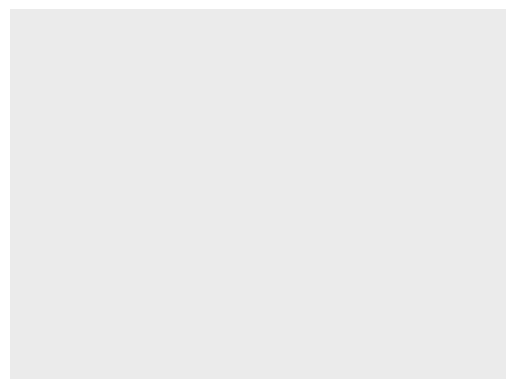

<ggplot: (8773440790669)>

In [17]:
ggplot(cars)

Next you define the mapping of your variables to perceivable aesthetics like the x position. This still does not draw any points, but already creates an axis label with appropriate limits.

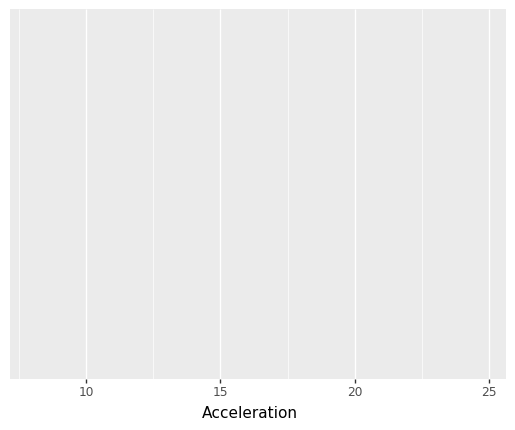

<ggplot: (8773440791756)>

In [18]:
ggplot(cars, aes(x='Acceleration'))

The final part is to use some geometrical object, that gets calculated based on the mapping. `ggplot` does this by overriding the `+`-operator to add different `geoms` to the plot. Layer by layer. Once you understood this basic pattern, you have understood the *grammar of graphics*.

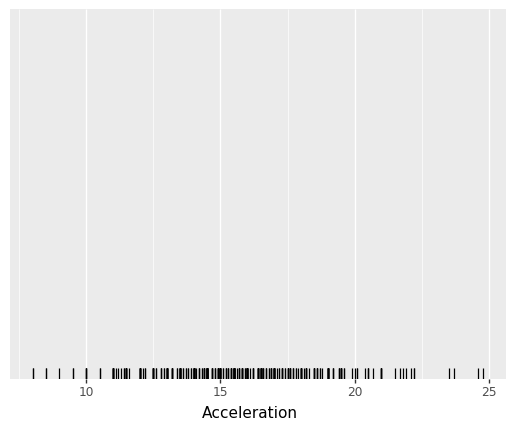

<ggplot: (8773440791672)>

In [19]:
ggplot(cars, aes(x='Acceleration')) + geom_rug()

My recommandation for formating your `ggplot` code is to wrap the whole expresson in parantheses and then put each `geom` that you add on a separte line with the plus upfront. This way the code is very readable and you can simply comment out a single line to remove that layer from the plot, without touching the rest of the code.

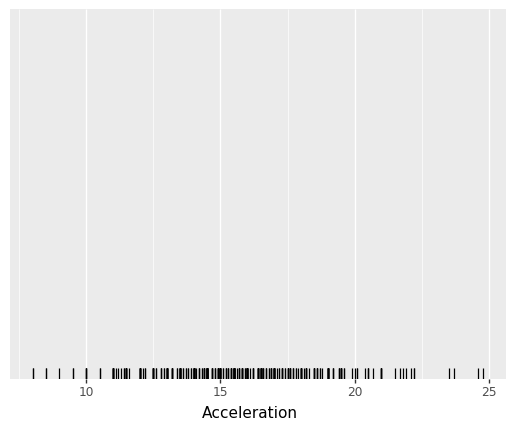

<ggplot: (-9223363263414005809)>

In [20]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_rug()
)

The power of the grammar of graphics is that you do not need to remember or search for a lot of configuration parameters of plotting functions. Instead, you can compose very complex plots out of simple expressions. For example, several `geoms` can be added to create more complex plots.

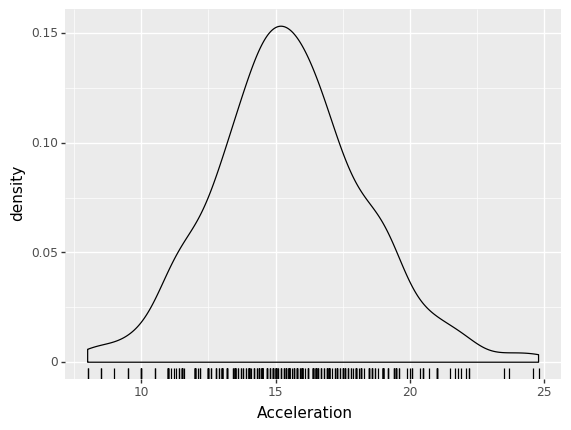

<ggplot: (-9223363263414081543)>

In [22]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_rug()
 + geom_density()
)

By default all added `geoms` will inherit the `aes` mapping of the plot. However, you can also override this by passing a new `aes` object. In practice this not so often needed though. 

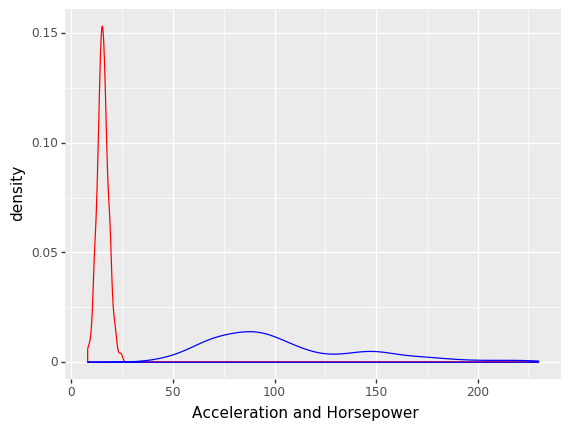

<ggplot: (-9223363263414143919)>

In [23]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_density(color='red') # This geom uses Acceleration
 + geom_density(aes(x='Horsepower'), color='blue') # This geom uses Horsepower.
 + labs(x='Acceleration and Horsepower')
)

Now that we understood the basics of `gglot` let's dive into the dataset. First we look at the distribution of a single variable.

## Exploring a single variable

### Histograms

/home/chris/anaconda3/envs/scientific_programming/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning:

'stat_bin()' using 'bins = 18'. Pick better value with 'binwidth'.



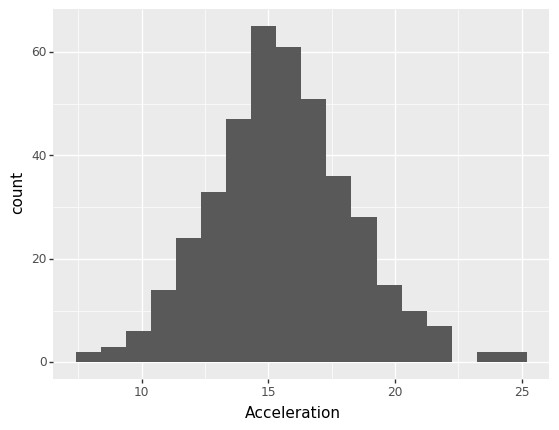

<ggplot: (-9223363263414143989)>

In [24]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_histogram() #customization with kwargs: bins=50
)

Many geoms are just combinations of less complex geoms and stats. For example a histogram is just a bar plot with a binning statistic.

/home/chris/anaconda3/envs/scientific_programming/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning:

'stat_bin()' using 'bins = 18'. Pick better value with 'binwidth'.



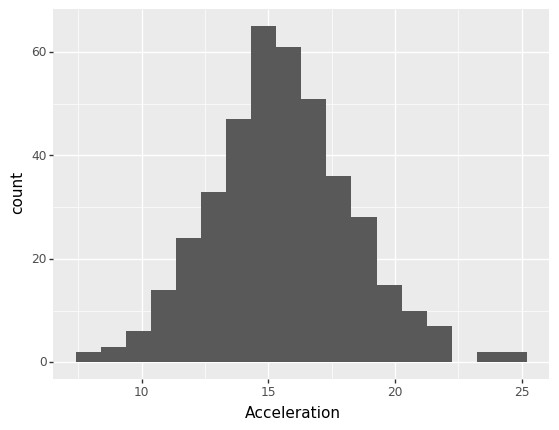

<ggplot: (-9223363263414232958)>

In [25]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_bar(stat=stat_bin())
)

If you want to access variables that are not directly available from the dataset, but rather get calculated by some stat, you can do so by wrapping the variable into `"stat()"`. This way we can get a normalized histogram.

/home/chris/anaconda3/envs/scientific_programming/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning:

'stat_bin()' using 'bins = 18'. Pick better value with 'binwidth'.



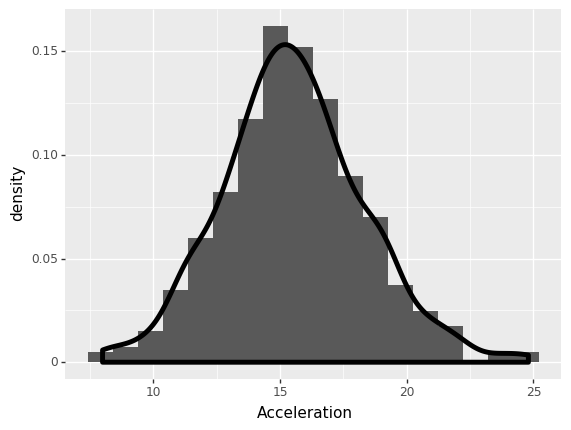

<ggplot: (8773440579876)>

In [30]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_histogram(aes(y='stat(density)'))
 + geom_density(size=2)
)

### Boxplots
For making a boxplot, we need to specify the x variable. If we want to make a boxplot for a single variable, we need to specify some number.

/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/plotnine/layer.py:517: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  return not cbook.iterable(value) and (cbook.is_numlike(value) or


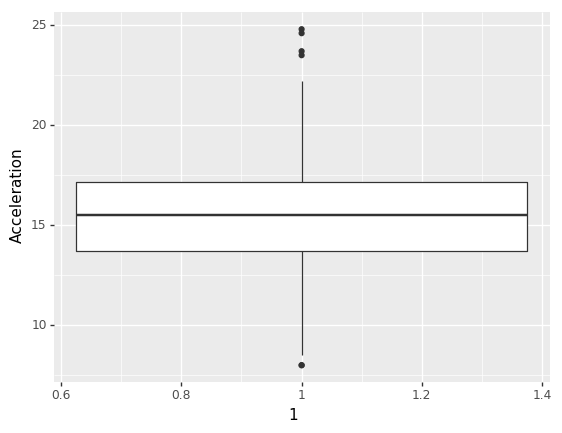

<ggplot: (-9223363289749994075)>

In [18]:
(ggplot(cars, aes(x=1, y='Acceleration')) 
 + geom_boxplot()
)

### Exercise
For the exercise we will turn to the `barley` dataset. The description on vega_datasets states

> The result of a 1930s agricultural experiment in Minnesota, this dataset contains yields for 10 different varieties of barley at six different sites. It was first published by agronomists F.R. Immer, H.K. Hayes, and L. Powers in the 1934 paper "Statistical Determination of Barley Varietal Adaption." R.A. Fisher's popularized its use in the field of statistics when he included it in his book "The Design of Experiments." Since then it has been used to demonstrate new statistical techniques, including the trellis charts developed by Richard Becker, William Cleveland and others in the 1990s.

In [19]:
barley = vega_datasets.data.barley()
barley.head()

,site,variety,year,yield
0,University Farm,Manchuria,1931,27.00000
1,Waseca,Manchuria,1931,48.86667
2,Morris,Manchuria,1931,27.43334
3,Crookston,Manchuria,1931,39.93333
4,Grand Rapids,Manchuria,1931,32.96667


Make a histogram of the `yield` for all observations. Make the bins 5 units wide. 

## Exploring the relation of one continuous and one categorical variable

It is common to split the boxplot by a categorical variable. This is where more of the ggplot magic comes into play. Under the hood, ggplot performs a `groupby` operation on the x variable, applies the boxplot computations on every group and combines the results into a single plot. 

### Boxplots

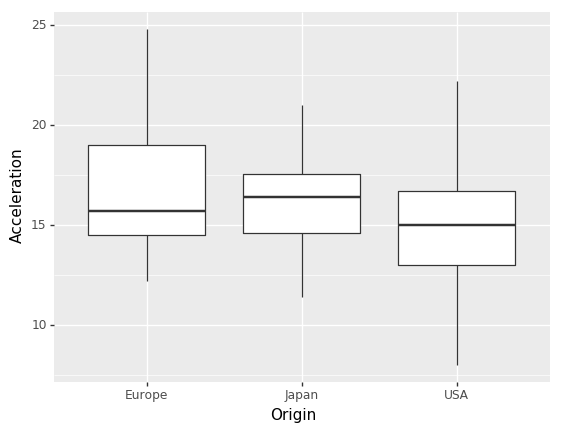

<ggplot: (8747104739767)>

In [22]:
(ggplot(cars, aes(x='Origin', y='Acceleration')) 
 + geom_boxplot()
)

Sometimes it can make sense to "jitter", i.e. to randomly disturb, the original data points and put them on top of the boxplots. This gives you a feeling for the amount and distribution of the original data.

### Jittering

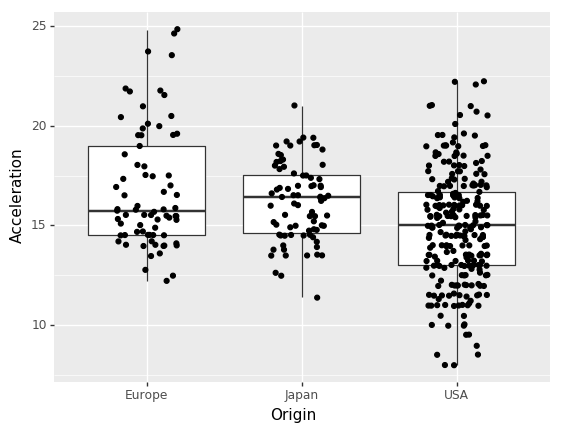

<ggplot: (-9223363289749952915)>

In [23]:
(ggplot(cars, aes(x='Origin', y='Acceleration')) 
 + geom_boxplot()
 + geom_jitter(width=0.2)
)

### Violinplots
Violinplots are nice alternative to boxplots.

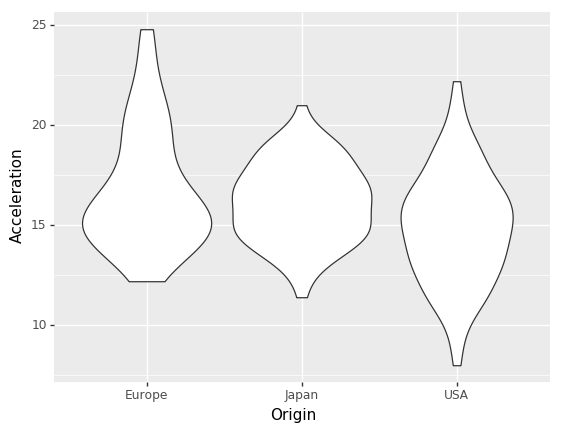

<ggplot: (-9223363289750000233)>

In [24]:
(ggplot(cars, aes(x='Origin', y='Acceleration')) 
 + geom_violin()
)

Adding `stat_summary` gives more information by displaying mean and standard deviation. This also demonstrates that not just every `geom` is by default associated with some `stat`, but also every `stat` is by default associated with some `geom`.

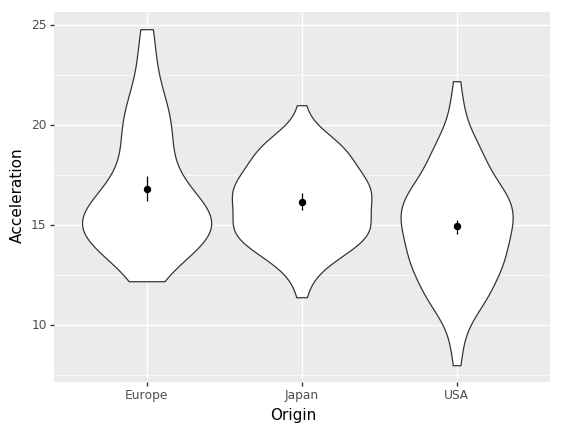

<ggplot: (-9223363289750142576)>

In [25]:
(ggplot(cars, aes(x='Origin', y='Acceleration')) 
 + geom_violin()
 + stat_summary()
)

Violinplots can be nicely combined with boxplots. This combines the strength of density estimation and point estimates, such as the median and quartiles.

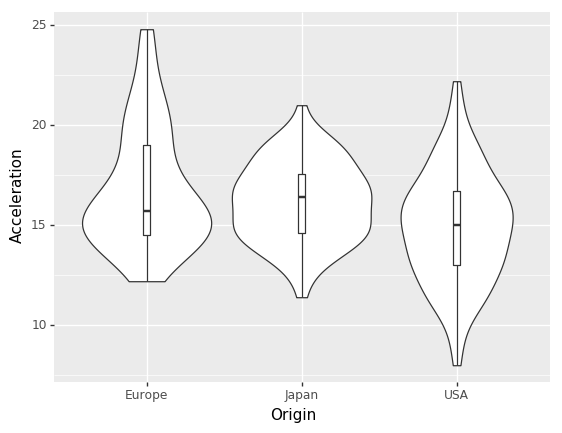

<ggplot: (-9223363289750176729)>

In [26]:
(ggplot(cars, aes(x='Origin', y='Acceleration')) 
 + geom_violin()
 + geom_boxplot(width=0.05)
)

Just looking at density split by a categorical variable is alsow very helpful.

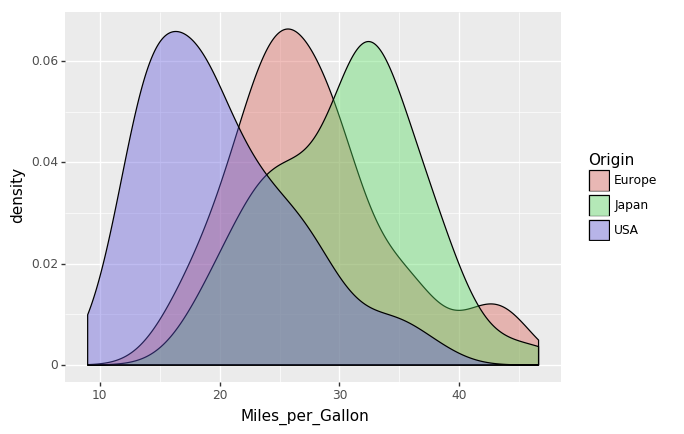

<ggplot: (8747104594994)>

In [27]:
(ggplot(cars, aes(x='Miles_per_Gallon', fill='Origin')) 
 + geom_density(alpha=0.4)
)

The same can be done with histograms.

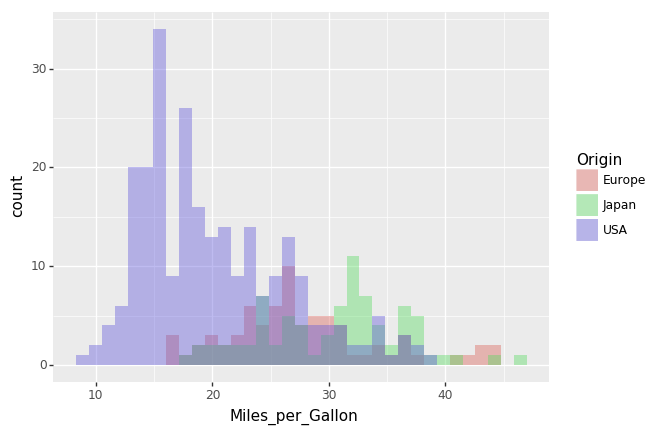

<ggplot: (-9223363289750186366)>

In [28]:
(ggplot(cars, aes(x='Miles_per_Gallon', fill='Origin')) 
 + geom_histogram(alpha=0.4, bins=35, position='identity')
)

Let's look at a comparision to matplotlib, to see how much code we save by using ggplot.

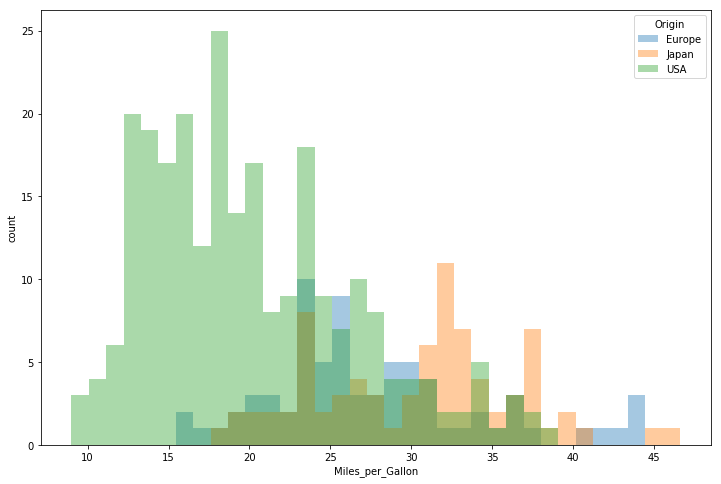

In [29]:
var_to_plot = 'Miles_per_Gallon'
var_to_split = 'Origin'
bins = np.histogram_bin_edges(cars[var_to_plot], bins=35)
fig, ax = plt.subplots(figsize=(12, 8))
for name, group in cars.groupby(var_to_split):
    ax.hist(var_to_plot, bins=bins, data=group, label=name, alpha=0.4)
ax.set(xlabel=var_to_plot, ylabel='count')
ax.legend(title=var_to_split)

We see that ggplot takes care of a lot of logic for us. The plot even looks a bit different, becaues ggplot does a few things under the hood to improve the placement of the bins.

### Exercise
For the exercise we get back to the barley dataset. Make a violinplot of the `yield` for each `site`. Jitter the original data points on top of the violins.  

## Exploring the relation of two continuous variables
Let's now explore the interaction of two continuous variables. A standard way of doing this is the scatter plot.

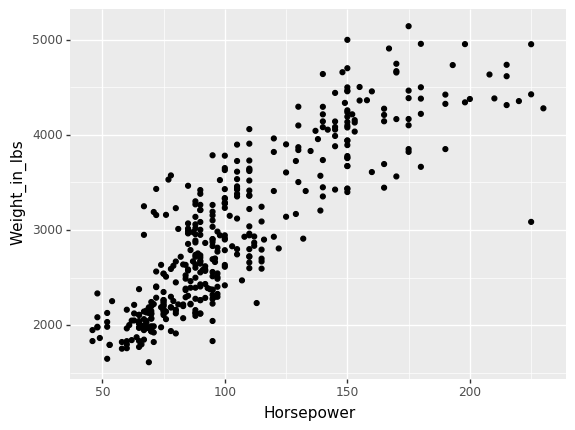

<ggplot: (8727400757035)>

In [146]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + geom_point()
)

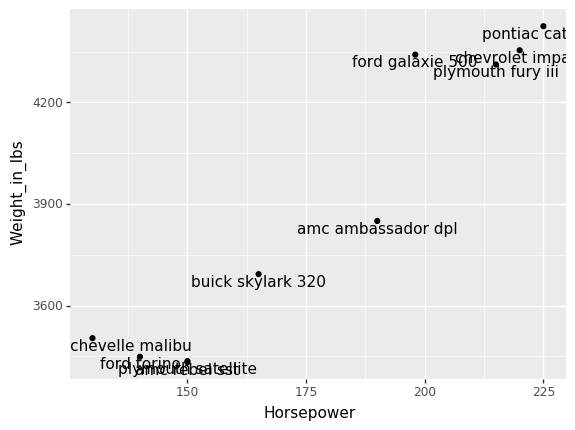

<ggplot: (8727400683384)>

In [147]:
(ggplot(cars.iloc[:10], aes(x='Horsepower', y='Weight_in_lbs', label='Name')) 
 + geom_point()
 + geom_text(va='top')
)

Scatterplots sometimes suffer from *overplotting*. That means that points overlap with each other so we cannot distinguish them anymore. A `stat` that avoids this is a two dimensional kernel density estimate.

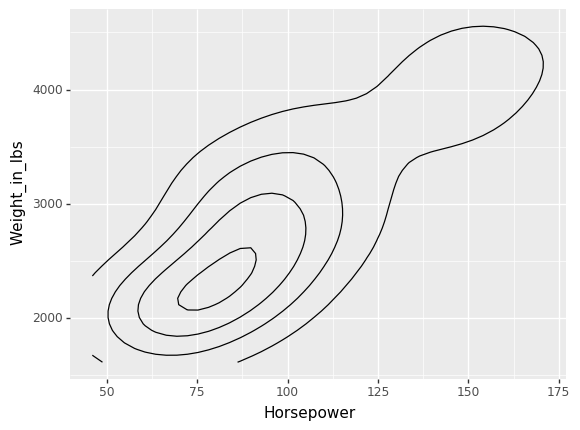

<ggplot: (-9223363309453872836)>

In [135]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + geom_density_2d() #levels=10, 
)

Again, using "stat()" is often helpful. We can for example add a colored filling to our density plot.

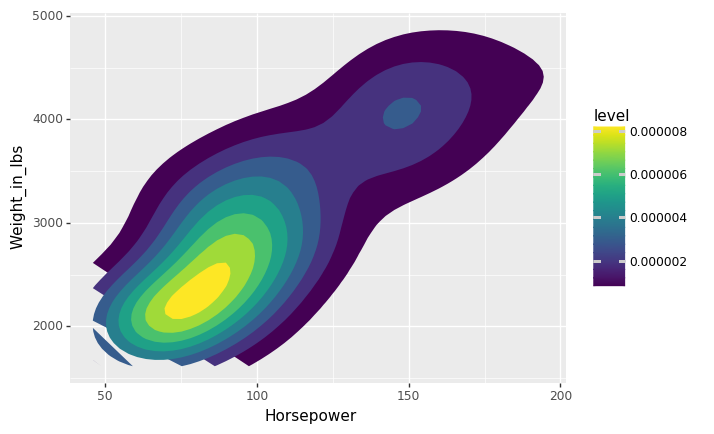

<ggplot: (8747104957069)>

In [35]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + stat_density_2d(geom='polygon', mapping=aes(fill='stat(level'), levels=10)
)

Another way of avoiding overplotting is to use a countplot.

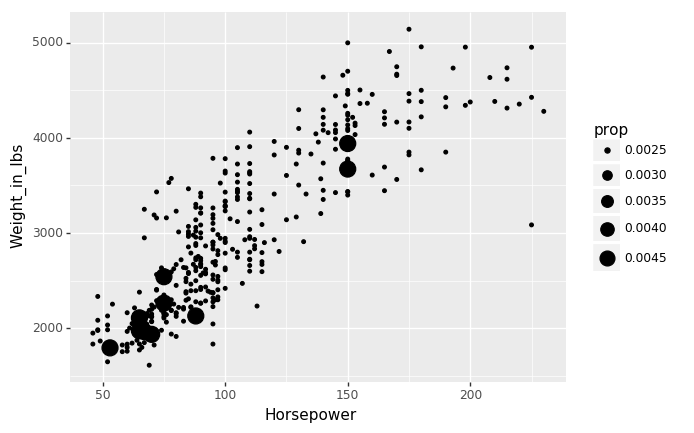

<ggplot: (-9223363289749903223)>

In [36]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + geom_count()
)

### Regression
With regression lines we can easily add more information to scatterplots. By default `geom_smooth` uses loess smoothing, i.e. [local regression](http://genomicsclass.github.io/book/pages/smoothing.html). In a nutshell, loess computes regression lines in a rolling window and then combines them into a smooth curve.

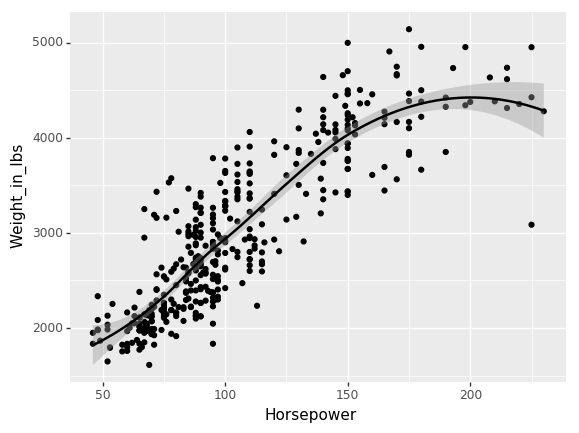

<ggplot: (8747104693652)>

In [37]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + geom_point()
 + geom_smooth()
)

However, you can also use a simple *linear model* (lm). This also gives a confidence band for the standard error.

/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


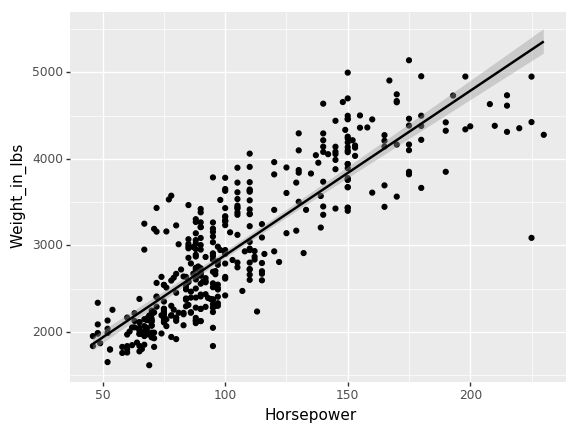

<ggplot: (-9223363289750022063)>

In [38]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + geom_point()
 + geom_smooth(method='lm')
)

The model is fit for each group when we split the data by another variable.

/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


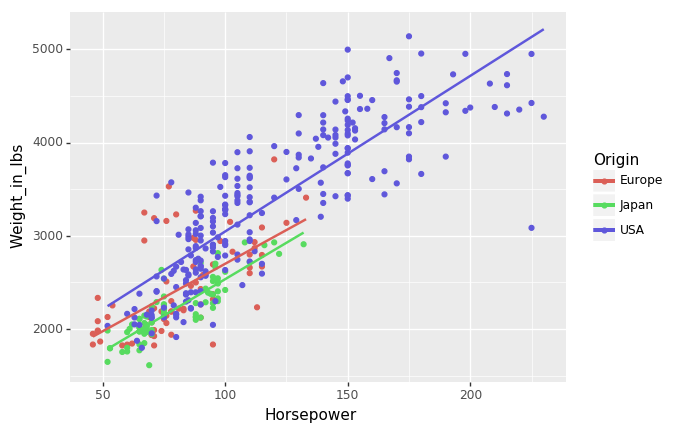

<ggplot: (8747104603407)>

In [39]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs', color='Origin')) 
 + geom_point()
 + geom_smooth(method='lm', se=False)
)

### Exercise
For the next exercise, we will take a look at the `countries` dataset that contains developmental indices for many countries of the world. Plot `Literacy` vs. `GDP` and fit a loess smoothed curve through the points. How do the variables relate? 

In [149]:
countries = pd.read_csv("data/countries.csv", index_col=0)
countries.head()

,Country,Subcontinent,Region,In EU,Population,Area,Pop. Density,Coastline,Net migration,Infant mortality,...,Phones,Arable,Crops,Other,Climate,Birthrate,Deathrate,Agriculture,Industry,Service
0,Afghanistan,West & Central Asia,ASIA (EX. NEAR EAST),False,31056997,1.677019e+06,47.96,0.00,23.06,163.07,...,3.22,12.13,0.22,87.65,1.0,46.60,20.34,0.380,0.240,0.380
1,Albania,Europe,EASTERN EUROPE,False,3581655,7.445703e+04,124.59,1.26,-4.93,21.52,...,71.20,21.09,4.42,74.49,3.0,15.11,5.22,0.232,0.188,0.579
2,Algeria,North Africa,NORTHERN AFRICA,False,32930091,6.168683e+06,13.83,0.04,-0.39,31.00,...,78.10,3.22,0.25,96.53,1.0,17.14,4.61,0.101,0.600,0.298
3,American Samoa,Oceania,OCEANIA,False,57794,5.154080e+02,290.42,58.29,-20.71,9.27,...,259.54,10.00,15.00,75.00,2.0,22.46,3.27,NaN,NaN,NaN
4,Andorra,Europe,WESTERN EUROPE,False,71201,1.212115e+03,152.14,0.00,6.60,4.05,...,497.18,2.22,0.00,97.78,3.0,8.71,6.25,NaN,NaN,NaN


## More dimensions with more aesthetics
In fact we can combine quite a few more than just two variables on a two dimensional plot.

In [45]:
cars.head()

,Acceleration,Cylinders,Displacement,Horsepower,Miles_per_Gallon,Name,Origin,Weight_in_lbs,Year
0,12.0,8,307.0,130.0,18.0,chevrolet chevelle malibu,USA,3504,1970-01-01
1,11.5,8,350.0,165.0,15.0,buick skylark 320,USA,3693,1970-01-01
2,11.0,8,318.0,150.0,18.0,plymouth satellite,USA,3436,1970-01-01
3,12.0,8,304.0,150.0,16.0,amc rebel sst,USA,3433,1970-01-01
4,10.5,8,302.0,140.0,17.0,ford torino,USA,3449,1970-01-01


We can add one more continuous variable, by mapping it to a color scale.

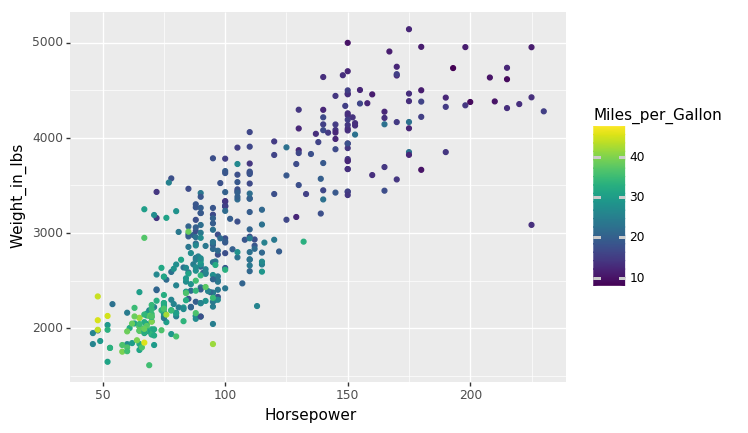

<ggplot: (-9223363289750137042)>

In [46]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs', color='Miles_per_Gallon')) 
 + geom_point()
)

We can add another continuous variable, by making the size of the markers proportional to its value. In this case we are showing the "Displacement" (Hubraum) which is the swept volume of all the pistons inside the cylinders of the engine.

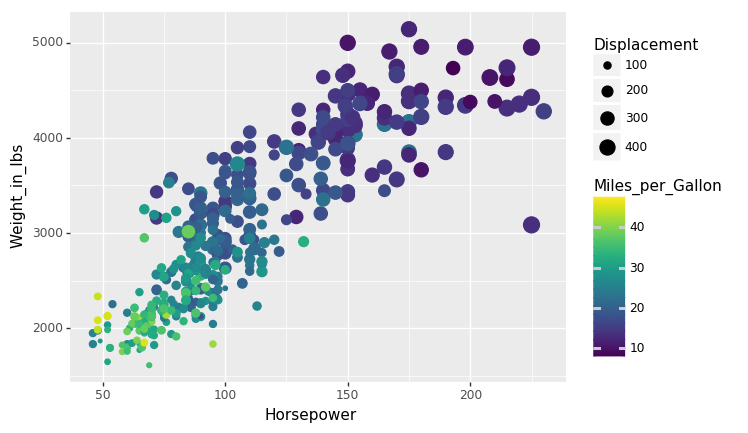

<ggplot: (8747104769288)>

In [47]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs', color='Miles_per_Gallon', size='Displacement')) 
 + geom_point()
)

We can add another categorical variable by binding it to the `shape` aesthetic. This way we now have five different variables in our 2d plot. 

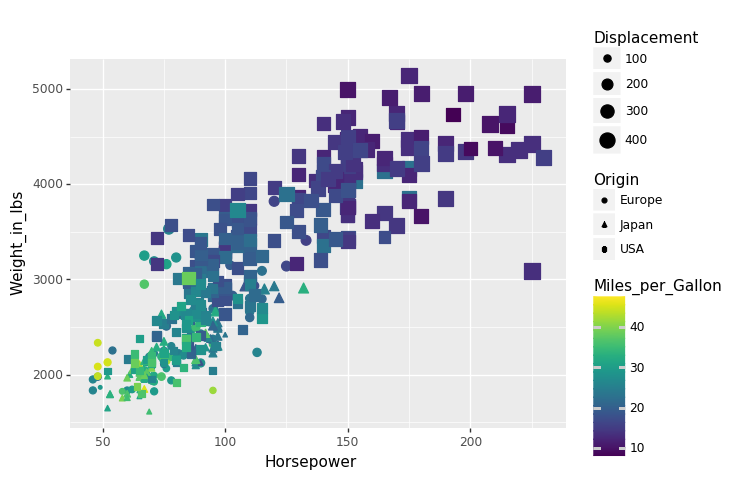

<ggplot: (-9223363289749967991)>

In [49]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs', color='Miles_per_Gallon', size='Displacement', shape='Origin')) 
 + geom_point()
)

Using multiple plots, we can even add the `Cylinders` variable. `facet_wrap` just puts all the plots next to one another, wrapping after a fixed number of columns.

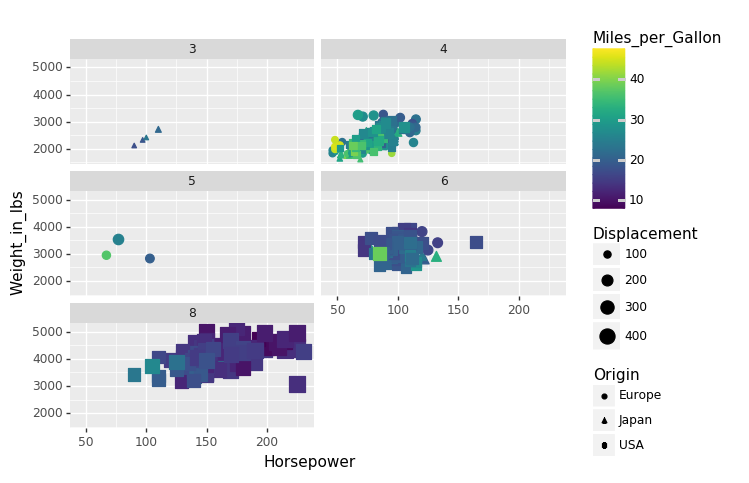

<ggplot: (-9223363309454515887)>

In [154]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs', color='Miles_per_Gallon', size='Displacement', shape='Origin')) 
 + geom_point()
 + facet_wrap('Cylinders', ncol=2)
)

In contrast to `facet_wrap`, `facet_grid` explicitly maps variables to rows and columns. Let's convert the `Year` to an `int` so it can be included in the grid.

In [155]:
cars['year_int'] = cars['Year'].dt.year
cars['year_int'].value_counts()

1982    61
1973    40
1978    36
1970    35
1976    34
1975    30
1980    29
1979    29
1971    29
1977    28
1972    28
1974    27
Name: year_int, dtype: int64

Looking at the dataframe, we have almost included all variables in our plot except for `Name` and `Acceleration`. Since putting text labels to points does not make so much sense on this scale, we just add the `Acceleration` variable to the plot. To do this, we first have to turn in into a categorical variable.

In [157]:
cars['Acceleration'].describe()

count    406.000000
mean      15.519704
std        2.803359
min        8.000000
25%       13.700000
50%       15.500000
75%       17.175000
max       24.800000
Name: Acceleration, dtype: float64

In [158]:
cars['acceleration_cat'] = pd.qcut(cars['Acceleration'], q=3, labels=['slow', 'middle', 'fast'])
cars['acceleration_cat'].head()

0    slow
1    slow
2    slow
3    slow
4    slow
Name: acceleration_cat, dtype: category
Categories (3, object): [slow < middle < fast]

Now we can extend one side of the facet grid with a combination of two variables.

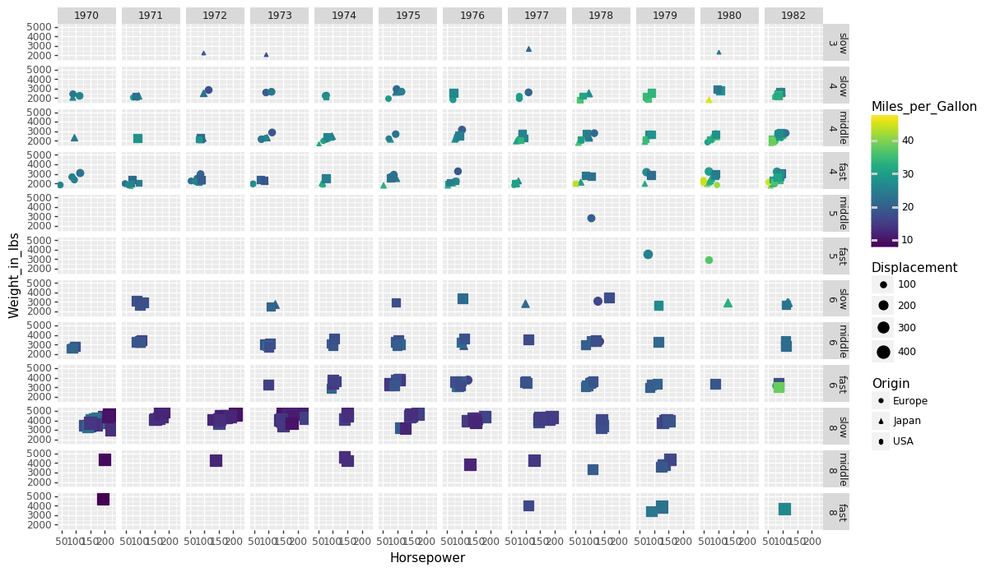

<ggplot: (8727398032269)>

In [161]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs', color='Miles_per_Gallon', size='Displacement', shape='Origin', label='Name')) 
 + geom_point()
 + facet_grid([['Cylinders', 'acceleration_cat' ], 'year_int'])   # R-Syntax would be 'Cylinders + acceleration_cat ~ year_int' (~ separating rows/cols, and + creating crossprod.)
 + theme(figure_size=(12, 8))                                     #                    (formular expression)
 #+ geom_text(va='top')
)

That's it! We combined eight variables in a single plot using only four lines of code!

## Exercise
Let's turn back to the `barley` dataset. Make a boxplot for the two years of the experiment each. Facet the plot by `site`.

**TIP:** When simply assigning `year` to the `x` aesthetic we see that `year` is interpreted as a continous variable. To avoid this, we can either convert `year` to a categorical variable or wrap the assignment in `factor(year)` expression. The latter way comes from `R`'s ggplot.

## Killer-Feature

Now it is time to show you the killer feature of ggplot that will get your paper published for sure!

/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['xkcd', 'Humor Sans', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/home/jarno/.miniconda/envs/scientific_programming/lib/python3.7/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['xkcd', 'Humor Sans', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


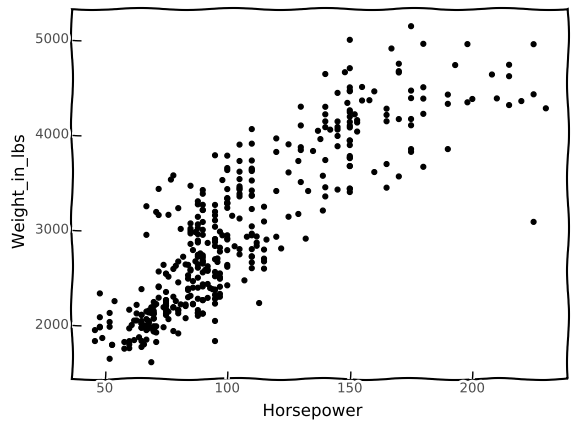

<ggplot: (8747061536716)>

In [64]:
(ggplot(cars, aes(x='Horsepower', y='Weight_in_lbs')) 
 + geom_point()
 + theme_xkcd()
)

Admittedly, this is rather a feature of `matplotlib` than of `ggplot`. It is available through `with plt.xkcd()`.

## Further Readings
A nice collection of R ggplot examples with good explanantions when to use them can be found under http://r-statistics.co/Top50-Ggplot2-Visualizations-MasterList-R-Code.html. As ggplot is very popular in the R community, it is usually good advise to look for R examples as most examples transfer to Python version with minor modifications.

You can read the original ggplot paper at https://vita.had.co.nz/papers/layered-grammar.html. It talks about design decisions of ggplot in more detail and compares it to the original grammar developed by Wilkinson.

# Seaborn
In contrast to `ggplot`, `seaborn` abstracts commonly used plots in functions that can be customized with arguments. In principle, seaborn should give you most of the functionality that ggplot gives you. 

We import seaborn under its common abbreviation `sns`. With `sns.set` we can change the styling and behavior of the plots. Calling it without arguments just activates the defaults. One strenght of seaborn is its very nice styling.

In [32]:
import seaborn as sns

sns.set()

Let's reset our dataset to its original form.

In [33]:
import vega_datasets
cars = vega_datasets.data.cars()
cars = cars.fillna(cars.median())
cars.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


We can now make a scatterplot matrix of all numeric variables with a single function call. 

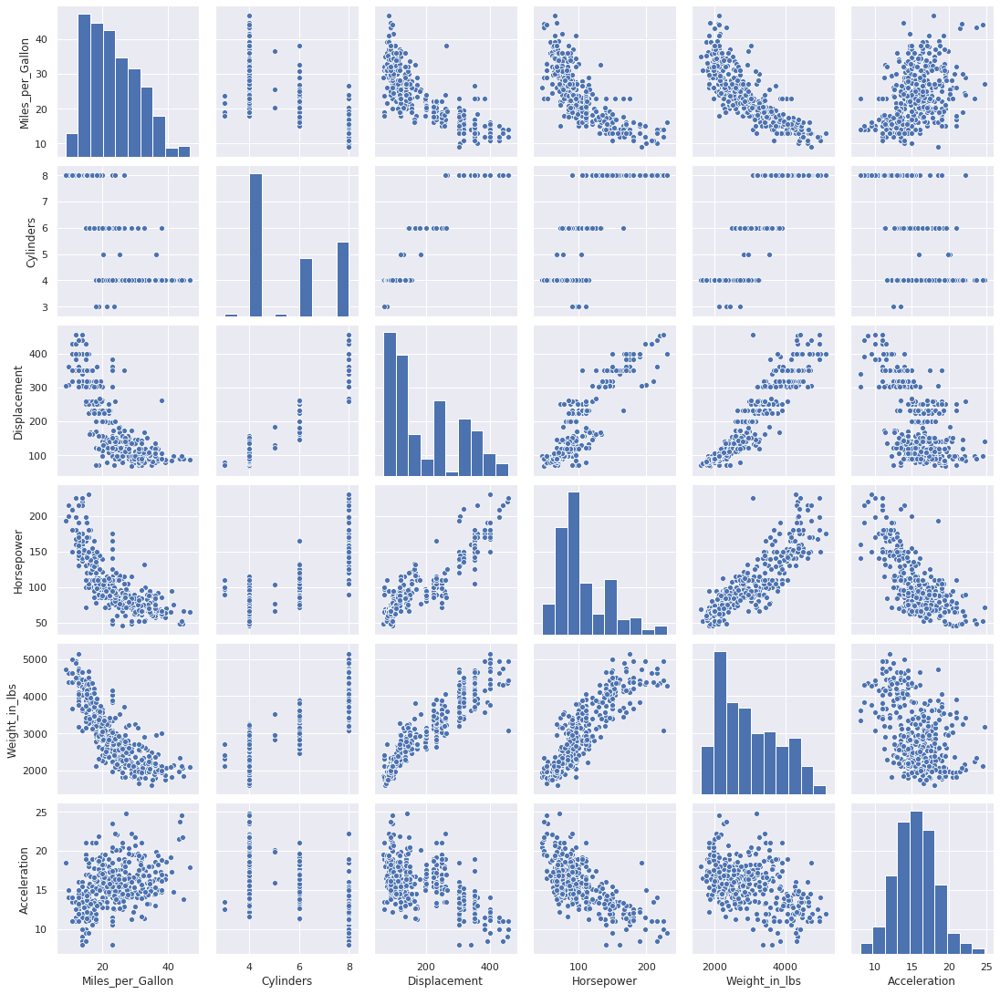

In [34]:
sns.pairplot(cars)

Seaborn also has the idea of aestheitc mappings. However, they are realized with keyword arguments that you pass to the functions and not with a separate `aes` object.

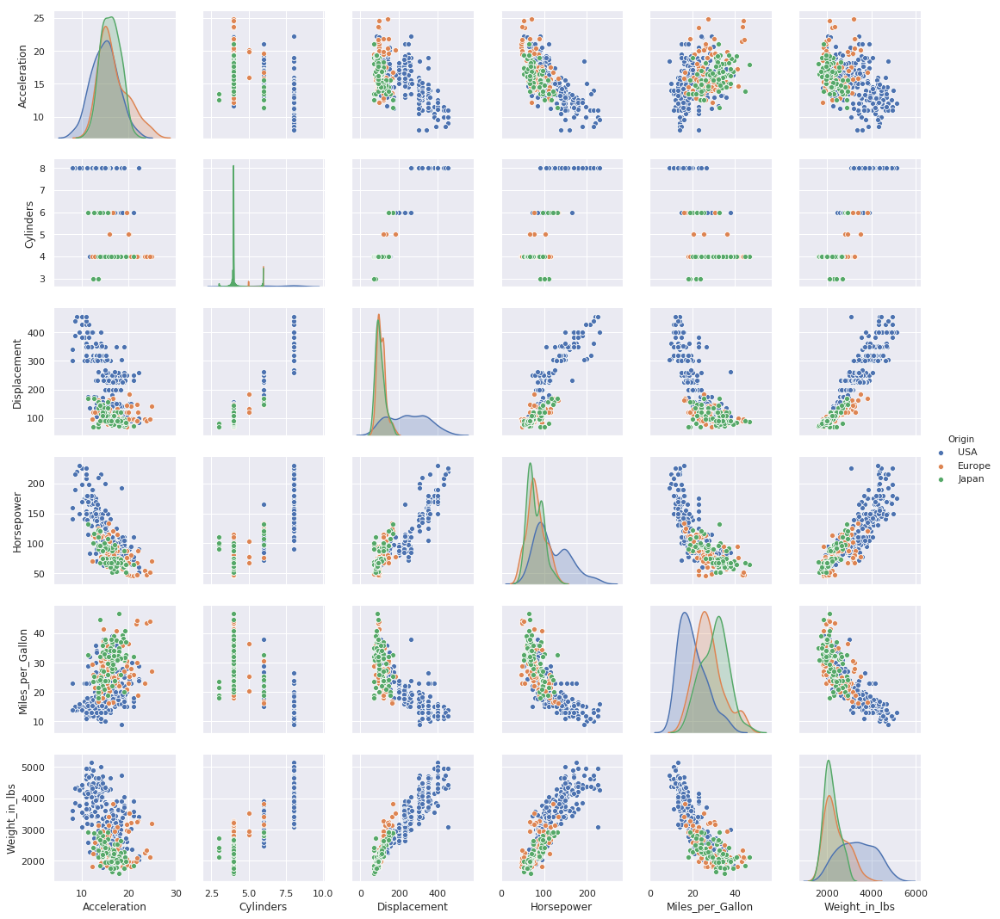

In [68]:
sns.pairplot(cars, hue='Origin')

## Exploring a single variable

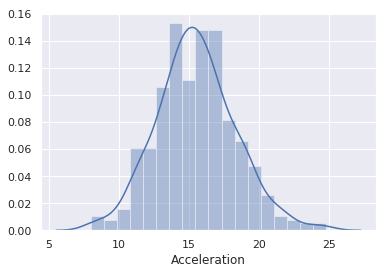

In [69]:
sns.distplot(cars['Acceleration'])

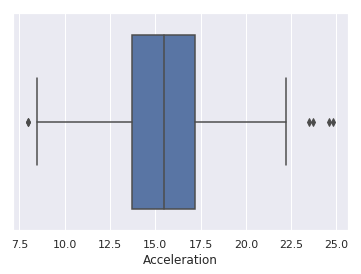

In [70]:
sns.boxplot('Acceleration', data=cars)

## Exploring the relation of one continuous and one categorical variable


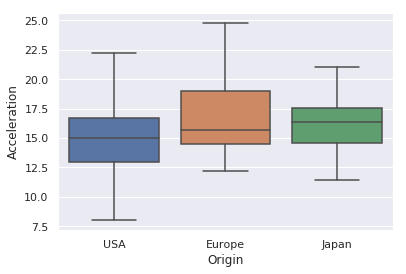

In [71]:
sns.boxplot(x='Origin', y='Acceleration', data=cars)

A nice alternative to `jitter` that is right now not included in Python's ggplot is the swarmplot. It also plots the original datapoints, but stacks similar datapoints side by side. This way we can get an impression of both data frequency and density.

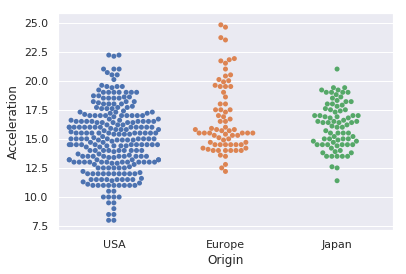

In [72]:
sns.swarmplot(x='Origin', y='Acceleration', data=cars)

Multiple plots can be combined by calling function after another. This is not as convenient as in ggplot, as the aesthetic mapping and the data binding has to be specified again.

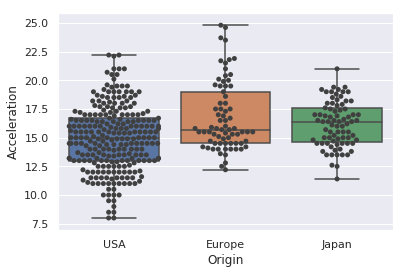

In [73]:
sns.boxplot(x='Origin', y='Acceleration', data=cars)
sns.swarmplot(x='Origin', y='Acceleration', color='0.25', data=cars)

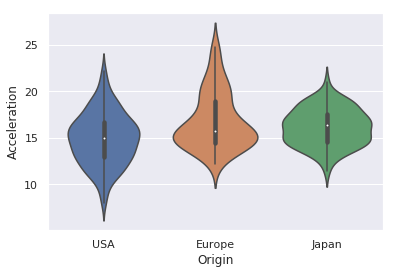

In [74]:
sns.violinplot(y='Acceleration', x='Origin', data=cars)

Let's create a binary variable, to demonstrate a nice twist for vioinplots.

In [75]:
cars['age'] = pd.cut(cars['Year'], bins=2, labels=['old', 'young'])

Using `split=True` each violing will show a different density, determined by the binary variable.

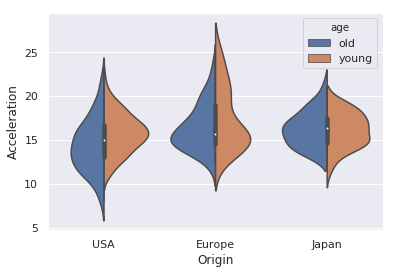

In [76]:
sns.violinplot(y='Acceleration', x='Origin', hue='age', split=True, data=cars)

## Exploring the relation of two continuous variables

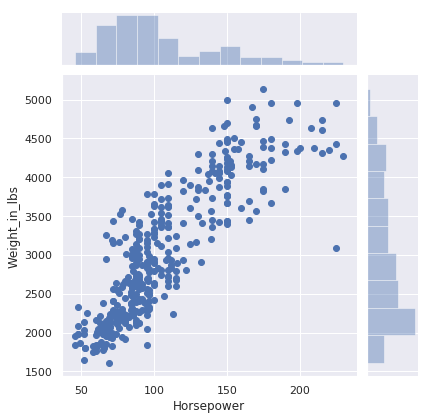

In [78]:
sns.jointplot(x='Horsepower', y='Weight_in_lbs', data=cars)

A "hexbin" plot is a kind of two dimensional histogram. Another way to avoid overplotting...

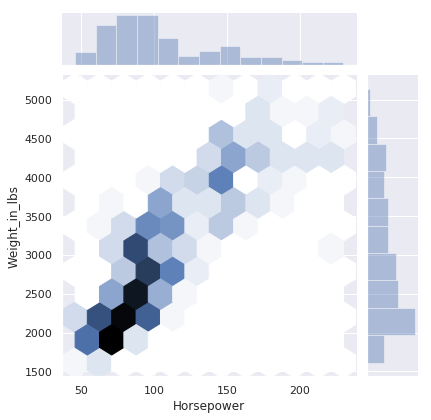

In [79]:
sns.jointplot(x='Horsepower', y='Weight_in_lbs', kind='hex', data=cars)

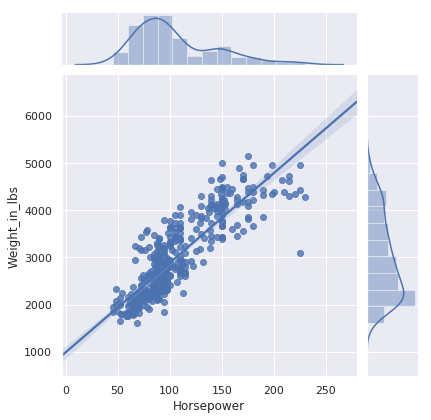

In [80]:
sns.jointplot(x='Horsepower', y='Weight_in_lbs', kind='reg', data=cars)

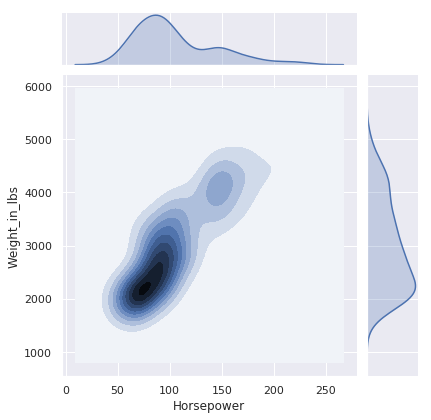

In [81]:
sns.jointplot(x='Horsepower', y='Weight_in_lbs', kind='kde', data=cars)

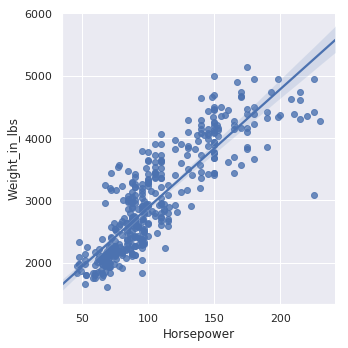

In [82]:
sns.lmplot(x='Horsepower', y='Weight_in_lbs', data=cars)

Many types of plots support **faceting** via the `col` or `row` argument.

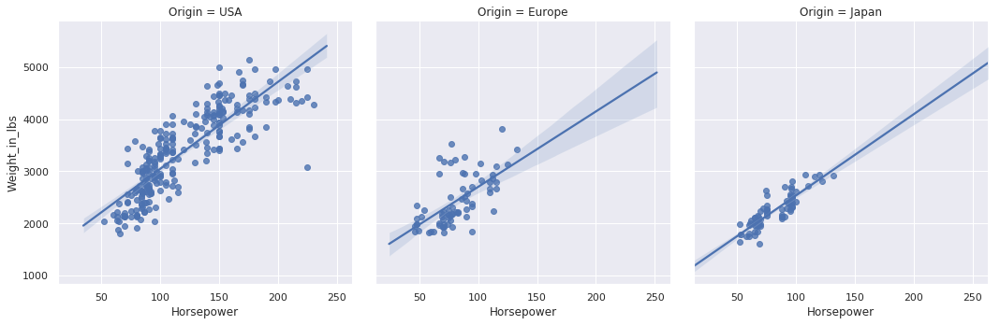

In [13]:
sns.lmplot(x='Horsepower', y='Weight_in_lbs', col='Origin', data=cars)

More complex facet plot can be created by first creating a `FacetGrid` object and then mapping a plotting function to each subplot. Similarly to ggplot, (unfortunately only categorical) data can be mapped to colors.

In [35]:
cars['year_int'] = cars['Year'].dt.year

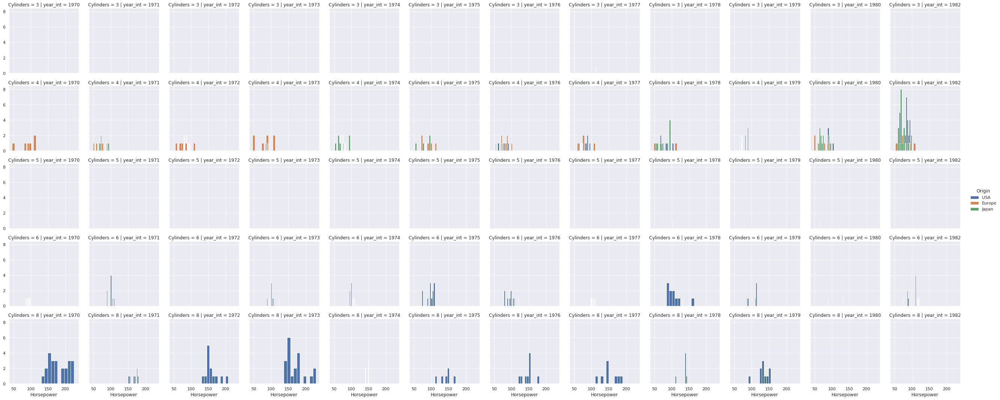

In [36]:
g = sns.FacetGrid(cars, row='Cylinders', col='year_int', hue='Origin')
g = g.map(plt.hist, 'Horsepower')
g.add_legend()


## Exercise
Make a violinplot for each `variety` in the `barley` dataset. Split the boxplot by color for the two years.

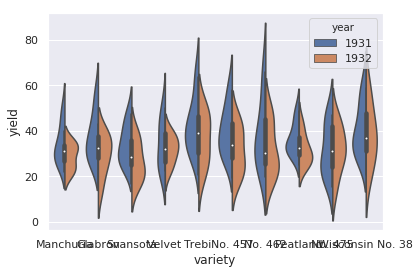

In [86]:
sns.violinplot(x="variety", y="yield", hue="year", split=True, data=barley)

# Customization with matplotlib
As both `seaborn` and `plotnine` use matplotlib to render the plots we can use all the matplotlib methods that we know and love to customize our plots.

## Customization for seaborn
In `seaborn` most functions just return a standard matplotib `Axes` object.

<class 'matplotlib.axes._subplots.AxesSubplot'>


[Text(0.5, 1.0, 'Distribution')]

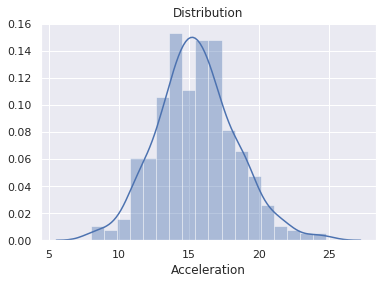

In [87]:
plot = sns.distplot(cars['Acceleration'])
print(type(plot))
plot.set(title='Distribution')

Alternatively, we can pass an `Axes` to plot on.

[Text(0.5, 0, 'acc'), Text(0.5, 1.0, 'Distribution')]

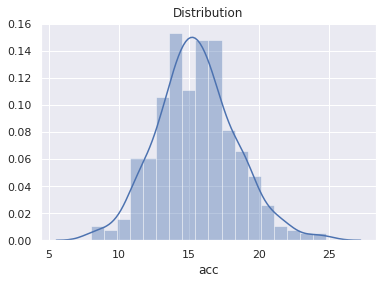

In [88]:
fig, ax = plt.subplots()
sns.distplot(cars['Acceleration'], ax=ax)
ax.set(title='Distribution', xlabel="acc")

## Customization for ggplot
With `ggplot` we have to call the `draw` method to obtain a reference to the matplotlib `figure`.

/home/chris/anaconda3/envs/scientific_programming/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning:

'stat_bin()' using 'bins = 18'. Pick better value with 'binwidth'.



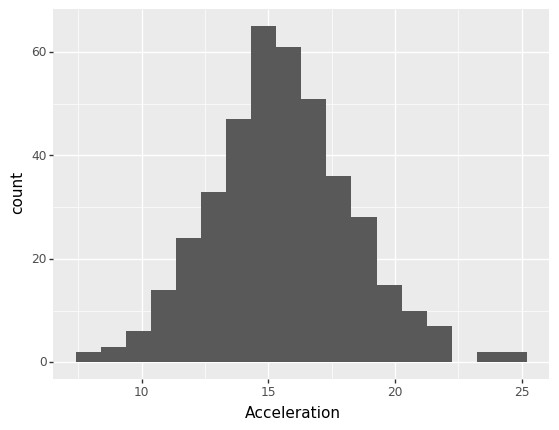

In [44]:
fig = (ggplot(cars, aes(x='Acceleration')) 
 + geom_histogram()
).draw();

In [39]:
type(fig)

matplotlib.figure.Figure

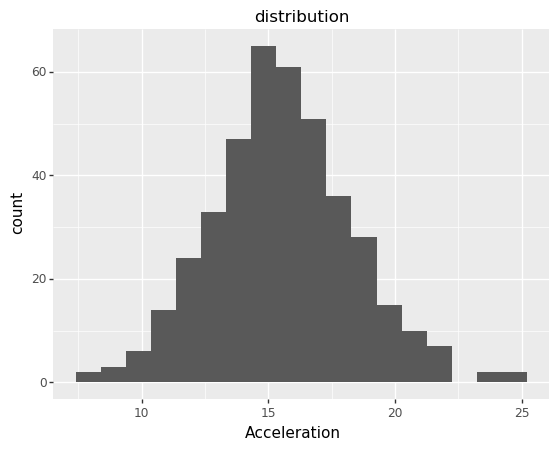

In [43]:
fig.axes[0].set(title='distribution')
fig

The same could be accomplished with *method chaining*.

/home/chris/anaconda3/envs/scientific_programming/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning:

'stat_bin()' using 'bins = 18'. Pick better value with 'binwidth'.



[Text(0.5, 1.0, 'distribution')]

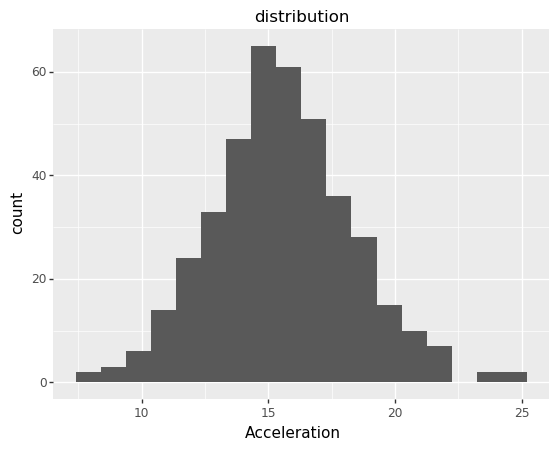

In [45]:
(ggplot(cars, aes(x='Acceleration')) 
 + geom_histogram()
).draw().axes[0].set(title='distribution')

## Exercise
Our first attempt at a violinplot with seaborn looked ok, but the x-ticklabels were overlapping. Let's fix this by passing using the power of matplotlib. Pass an `axes` to the seaborn function. Then rotate the x-ticklabels. You can use the following code to achieve the rotation

    ax.set_xticklabels(ax.get_xticklabels(), rotation=35, ha="right")

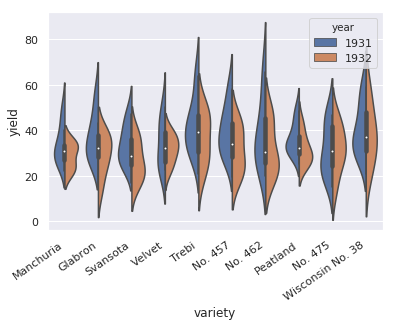

In [94]:
fig, ax = plt.subplots()
sns.violinplot(x="variety", y="yield", hue="year", split=True, data=barley, ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=35, ha="right");

.  

.  

.  

# Interactive Visualization

There are few actions less efficient in data exploration than re-running the same cell over and over again, each time slightly changing the input parameters. Further, when statically displaying data, there is no chance for any reader to look into the data in more detail, except by adding their own code. In this lecture, we will look at **interactive visualization**, that allows to display content with interactive controls to change inputs without needing to rewrite or rerun code.

# Plotly

Plotly is an interactive visualization library for python, that is not build ontop of matplotlib. It is meant for enterprise customers normally wants to run with Plotly's Chart Studio Cloud, which automatically stores your plots online, if you have an account. You can use it nonetheless without the online-constraint, and it automatically creates interactible plots as HTML.

Thanks to nice Jupyterlab-Extensions, these plots can also be rendered in Jupterlab.

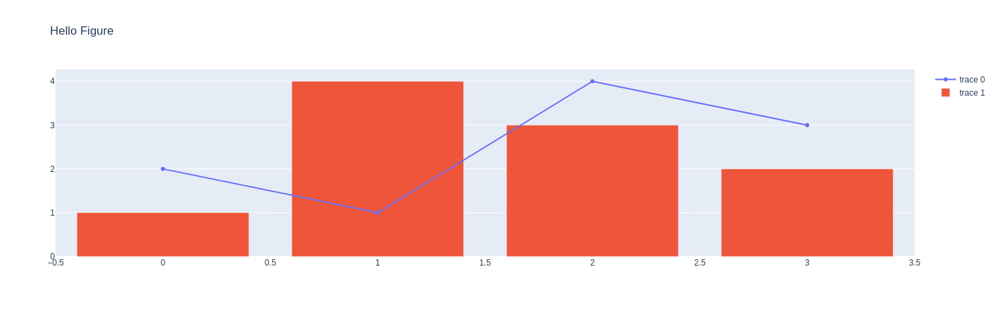

In [61]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(y=[2, 1, 4, 3]))
fig.add_trace(go.Bar(y=[1, 4, 3, 2]))
fig.update_layout(title = 'Hello Figure')
fig.show()

In [62]:
fig.write_html('first_figure.html', auto_open=True)

## Interactive Plots

While we deal with interactive Plots and Altair in a minute, let's first show that simple interactive plots are can also be used with other packages that combine with IPython-Widgets to display content. Here is a quick example using `cufflinks`, a wrapper around the `plotly`-library.

**If you have not followed the debugger-installation-instructions yet, then the requirements for this are not in your environment. To install plotly correctly, you have to run the following command inside your environment:** `jupyter labextension install @jupyterlab/plotly-extension`. If you have the debugger, you have more detailed installation instructions in the postbuild_debugging-script (see also https://github.com/plotly/plotly.py#overview)

In any case, you'll need to install the newest version of it: `pip install plotly==4.8.1`

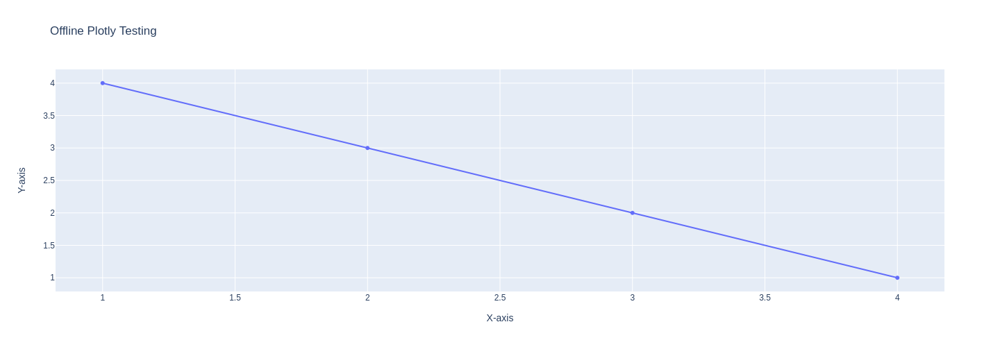

In [21]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.io as pio
import plotly.graph_objs as go


data = [go.Scatter(x=[1, 2, 3, 4], y=[4, 3, 2, 1])]
fig = go.Figure(data = data,layout = go.Layout(title='Offline Plotly Testing',width = 800,height = 500,
                                           xaxis = dict(title = 'X-axis'), yaxis = dict(title = 'Y-axis')))

# plot(fig) shows it in html
pio.show(fig)

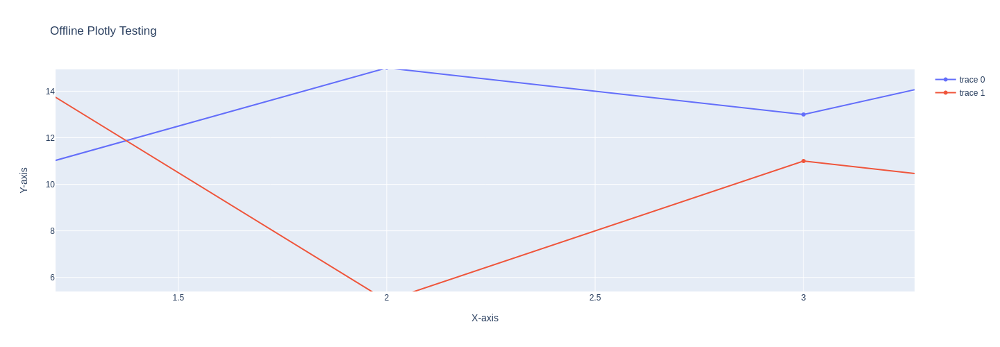

In [23]:
import plotly.graph_objects as go

trace0 = go.Scatter(
    x=[1, 2, 3, 4],
    y=[10, 15, 13, 17]
)
trace1 = go.Scatter(
    x=[1, 2, 3, 4],
    y=[16, 5, 11, 9]
)
data = [trace0, trace1]


fig = go.Figure(data = data,layout = go.Layout(title='Offline Plotly Testing',width = 800,height = 500,
                                           xaxis = dict(title = 'X-axis'), yaxis = dict(title = 'Y-axis')))

# plot(fig) shows it in html
pio.show(fig)

In [13]:
import plotly #>= 4.8 
import cufflinks #>= 0.17
assert int(plotly.__version__.split('.')[0]) > 4 or (int(plotly.__version__.split('.')[0]) == 4 and int(plotly.__version__.split('.')[1]) >= 8)
assert int(cufflinks.__version__.split('.')[0]) > 0 or (int(cufflinks.__version__.split('.')[0]) == 0 and int(cufflinks.__version__.split('.')[1]) >= 17)

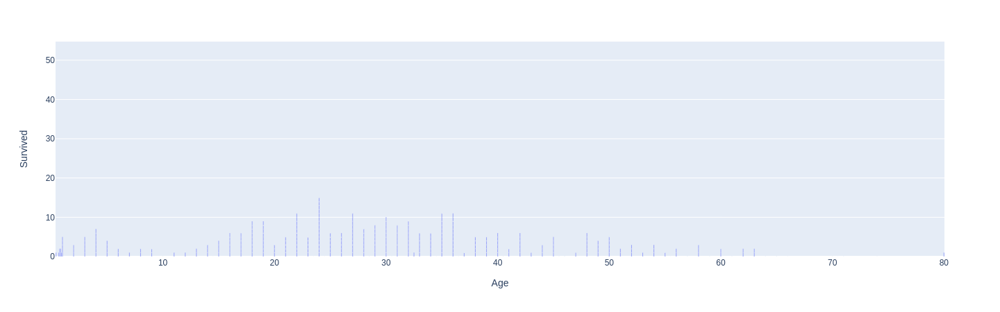

In [19]:
import pandas as pd
import plotly
pd.options.plotting.backend = "plotly"

titanic.plot(kind='bar', x='Age', y='Survived')

In [66]:
from IPython.display import IFrame

out = widgets.Output(layout={'border': '2px solid black'})
with out:
    display(IFrame(
        "https://plotly.com/python/",
        width="100%",
        height=700,
    ))
out

Output(layout=Layout(border='2px solid black'))

# Jupyter-Widgets

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import vega_datasets

Widgets are eventful python objects that have a representation in the browser, often as a control like a slider, textbox, etc. Widgets can be used to build interactive data exploration and interactive GUIs, allowing us to turn Jupyter Notebooks from static documents into interactive dashboards, perfect for exploring and visualizing data.

In [68]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [69]:
def f(slope, intercept):
    fig, ax = plt.subplots()
    x = np.linspace(-10, 10, num=1000)
    ax.plot(x, slope * x + intercept)
    ax.set_ylim(-5, 5)
    plt.show()

interactive_plot = interactive(f, slope=(-2.0, 2.0), intercept=(-3, 3, 0.5))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(FloatSlider(value=0.0, description='slope', max=2.0, min=-2.0), FloatSlider(value=0.0, d…


Widgets have their own display `repr` which allows them to be displayed using IPython’s display framework. Constructing and returning an `IntSlider` automatically displays the widget.

In [70]:
from IPython.display import display
widgets.IntSlider()

IntSlider(value=0)

Widgets can also be displayed by calling `display`. If you display the same widget twice, their front-end-representation will stay in sync:

In [71]:
w = widgets.IntSlider()
display(w)

IntSlider(value=0)

In [72]:
display(w)

IntSlider(value=0)

Note that we can get its `value`, however if you simply return it its not interactive!

In [73]:
w.value

0

To do that, we can `jslink` these widgets:

In [74]:
w2 = widgets.Label()
widgets.jslink((w, 'value'), (w2, 'value'))
display(w2)

Label(value='')

## The interact-function

At the most basic level, interact autogenerates UI controls for function arguments, and then calls the function with those arguments when you manipulate the controls interactively. To use interact, you need to define a function that you want to explore.

In [75]:
def f(x):
    return x**2

When you pass this function as the first argument to `interact` along with an integer keyword argument (`x=10`), a slider is generated and bound to the function parameter. When this slider is moved, the function is called (over and over again) with the current value of x.

In [4]:
interact(f, x=10);

interactive(children=(IntSlider(value=10, description='x', max=30, min=-10), Output()), _dom_classes=('widget-…

If you pass lists or dictionaries (not tuples!), it will make a dropdown menu:

In [76]:
#alternatively, passing a boolean creates a checkbox and passing a string a checkbox
interact(lambda x: x, x={'one':1,'two':2});

interactive(children=(Dropdown(description='x', options={'one': 1, 'two': 2}, value=1), Output()), _dom_classe…

`interact` can also be used as a decorator. This allows you to define a function and interact with it in a single shot. As this example shows, `interact` also works with functions that have multiple arguments. Note also that passing a `float` will produce a different kind of slider: The `FloatSlider`:

In [81]:
@interact(x=True, y=1.0)  # ipywidgets.fixed values will not lead to an interactive element --> y=fixed(1.0)
def g(x, y):              # note that we could also pick the initial value with the keyword-argument
    return (x, y)

interactive(children=(Checkbox(value=True, description='x'), FloatSlider(value=1.0, description='y', max=3.0, …

### Abbreviations

So far, we passed `ints`, `floats`, `booleans`, `strings`, `lists` and `dicts`. These are in fact only **abbreviations** for the respective widgets.

In [12]:
widgets.IntSlider(min=-10,max=30,step=1,value=10)

IntSlider(value=10, max=30, min=-10)

In [13]:
interact(lambda x:x, x=widgets.IntSlider(min=-10,max=30,step=1,value=10));

interactive(children=(IntSlider(value=10, description='x', max=30, min=-10), Output()), _dom_classes=('widget-…

Using the explicit variant gives you more control. For example, you can turn off continuous updates if you have a slow function:

In [82]:
def slow_function(i):
    print(int(i),list(x for x in range(int(i)) if
                str(x)==str(x)[::-1] and
                str(x**2)==str(x**2)[::-1]))
    return

interact(slow_function, 
         i= widgets.FloatSlider(
             value=2e5,
             min=1e5,
             max=1e7,
             step=1e5,
             description='Test:',
             disabled=False,
             continuous_update=False,    #continuous_update=False will make it listen only to MouseRelease-Events
             orientation='horizontal',
             readout=True,
             readout_format='.1f')
        );

interactive(children=(FloatSlider(value=200000.0, continuous_update=False, description='Test:', max=10000000.0…

## Other widgets

There are in fact quite many Jupyter Widgets!

In [18]:
from IPython.display import IFrame

out = widgets.Output(layout={'border': '2px solid black'})
with out:
    display(IFrame(
        "https://ipywidgets.readthedocs.io/en/stable/examples/Widget%20List.html",
        width="100%",
        height=600,
    ))
out

Output(layout=Layout(border='2px solid black'))

In [83]:
datepicker = widgets.DatePicker(
    description='Pick a Date',
    disabled=False
)

accordion = widgets.Accordion(children=[widgets.IntSlider(), widgets.Text()])
accordion.set_title(0, 'Slider')
accordion.set_title(1, 'Text')

tab_nest = widgets.Tab()
tab_nest.children = [accordion, datepicker]
tab_nest.set_title(0, 'An accordion')
tab_nest.set_title(1, 'A date-picker')
tab_nest

## Exercise

Let the following function **interact** with a **SelectMultiple**-widget!

In [23]:
known_fruits = ['Apples', 'Oranges', 'Pears', 'Grapes', 'Melons']
def some_func(fruits):
    print('Today I will eat '+' and '.join(fruits)+'.')

In [24]:
count_down(3)

In [25]:
interact(some_func, fruits=widgets.SelectMultiple(options=known_fruits));

interactive(children=(SelectMultiple(description='fruits', options=('Apples', 'Oranges', 'Pears', 'Grapes', 'M…

## `interactive`

When you want to reuse the widgets you're working with, you use `interactive` rather than `interact`:

In [84]:
from IPython.display import display
def f(a, b):
    display(a + b)
    return a+b

In [85]:
w = interactive(f, a=10, b=20)
type(w)

ipywidgets.widgets.interaction.interactive

In [86]:
display(w)

interactive(children=(IntSlider(value=10, description='a', max=30, min=-10), IntSlider(value=20, description='…

In [87]:
w.children

(IntSlider(value=2, description='a', max=30, min=-10),
 IntSlider(value=43, description='b', max=60, min=-20),
 Output(outputs=({'output_type': 'display_data', 'data': {'text/plain': '45'}, 'metadata': {}},)))

In [88]:
w.kwargs, w.result

({'a': 2, 'b': 43}, 45)

In [31]:
display(w)

interactive(children=(IntSlider(value=10, description='a', max=30, min=-10), IntSlider(value=20, description='…

## Example

In [89]:
import pandas as pd
titanic = pd.read_csv('titanic.csv')
titanic.head(2)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C


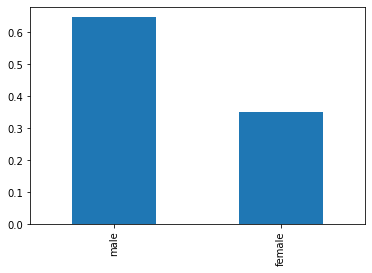

In [90]:
(titanic['Sex'].value_counts()/titanic['Sex'].count()).plot(kind='bar');

In [91]:
def plot_sex_distribution(dataset, agerange):
    dataset = dataset[dataset['Age'].between(agerange[0], agerange[1])]
    (dataset['Sex'].value_counts()/dataset['Sex'].count()).plot(kind='bar')
    
interactive(plot_sex_distribution, dataset=fixed(titanic), agerange=widgets.FloatRangeSlider(min=titanic['Age'].min(), max=titanic['Age'].max()))

interactive(children=(FloatRangeSlider(value=(20.315, 60.105), description='agerange', max=80.0, min=0.42), Ou…

You can use interactivity in all steps of your data analysis process!

In [92]:
@interact
def describe(column=list(titanic.columns)):
    print(titanic[column].describe())

interactive(children=(Dropdown(description='column', options=('PassengerId', 'Survived', 'Pclass', 'Name', 'Se…

In [107]:
import os
from IPython.display import Image

dir = '../week12-Statistical-Modeling/figures'

@interact
def show_images(file=os.listdir(dir)):
    display(Image(os.path.join(dir, file)))

interactive(children=(Dropdown(description='file', options=('nht.png', 'bootstrap.png'), value='nht.png'), Out…

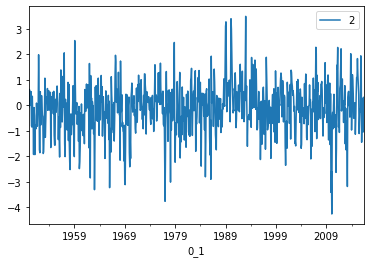

In [93]:
ts = pd.read_fwf('data/ao_monthly.txt', header=None, index_col=0,
                parse_dates=[[0, 1]], infer_datetime_format=True)

ts.plot();

In [94]:
def plot_between_dates(start_date, end_date):
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)
    plot_df = ts.loc[(ts.index >= start_date) & (ts.index <= end_date)].copy()
    print(f'There are {len(plot_df)} values between {start_date.date()} and {end_date.date()}.')
    plot_df.plot()
    
interact(plot_between_dates,
         start_date=widgets.DatePicker(value=ts.index.min()),
         end_date=widgets.DatePicker(value=ts.index.max()));

interactive(children=(DatePicker(value=Timestamp('1950-01-01 00:00:00'), description='start_date'), DatePicker…

## Displaying Text and more: the Output-Widget

Next to all the interactive-Input-Widgets, there is also the **Output-Widget**, which creates a container for output in the cell where it is used. You can create it once, add output to it with a bunch of methods and display it in every cell you need it:

In [95]:
out = widgets.Output(layout={'border': '1px solid black'})
out

Output(layout=Layout(border='1px solid black'))

You can use a context-manager to print text to this output:

In [96]:
with out:
    for i in range(5):
        print(i, 'Hello world!')

In [98]:
out.clear_output()

Further, you can use decorators or directly invoke the `append_stdout`-method:

In [100]:
out.append_stdout('\nI do not need to use context-managers or decorators!')

You can combine all Input-Widgets with the output-widget:

In [101]:
a = widgets.IntSlider(description='a')
b = widgets.IntSlider(description='b')
c = widgets.IntSlider(description='c')
def f(a, b, c):
    print('{}*{}*{}={}'.format(a, b, c, a*b*c))

out2 = widgets.interactive_output(f, {'a': a, 'b': b, 'c': c})

w = widgets.HBox([widgets.VBox([a, b, c]), out2])

In [102]:
display(w)

### Displaying Markdown and HTML

Using the `HTML` widget, you can display HTML and through the `markdown`-package also Markdown-Text:

In [104]:
import markdown 
from ipywidgets import HTML

html = markdown.markdown("""### Markdown""")
html += '\n<i>HTML</i>'
print(html)

<h3>Markdown</h3>
<i>HTML</i>


In [105]:
HTML(html) 

HTML(value='<h3>Markdown</h3>\n<i>HTML</i>')

## Events

You can bind callback-functions to interactive Elements such as buttons to add behaviour upon interaction with them:

In [108]:
button = widgets.Button(description="Click Me!")
display(button)

def on_button_clicked(b):
    print("Button clicked.")

button.on_click(on_button_clicked)

Button(description='Click Me!', style=ButtonStyle())

Note however, that to actually see something you have to use an interactive output!

In [109]:
out = widgets.Output(layout={'border': '1px solid black'})
out

Output(layout=Layout(border='1px solid black'))

In [110]:
def on_button_clicked_2(b):
    with out:
        print("Button clicked (2)")

button.on_click(on_button_clicked, remove=True)
button.on_click(on_button_clicked_2)

display(button)

Button(description='Click Me!', style=ButtonStyle())

## Jupyter Widgets and interactive plots

There also exists an independent third-party wrapper library around Plotly called Cufflinks, which provides similar functionality (with an API closer to that of Pandas' default matplotlib backend) by adding a .iplot() method to Pandas dataframes, as it was developed before Pandas supported configurable backends

In [111]:
import cufflinks as cf
cf.set_config_file(offline=True)

@interact
def scatter_plot(x=list(set(titanic.select_dtypes('number').columns)-{'Survived'}), 
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys()),
                 kind=['bar', 'barh', 'hexbin']):
    
    titanic.iplot(kind=kind, x=x, y='Survived', 
             xTitle=x.title(), yTitle='Survived', 
             title=f'Survived vs {x.title()}',
             theme=theme, colorscale=colorscale)

interactive(children=(Dropdown(description='x', options=('Age', 'Pclass', 'Fare', 'PassengerId', 'Parch', 'Sib…

In [112]:
interact(lambda age: print(titanic[titanic['Age']==age]['Survived'].sum()), age=(int(titanic['Age'].min()), int(titanic['Age'].max())));

interactive(children=(IntSlider(value=40, description='age', max=80), Output()), _dom_classes=('widget-interac…

## Further Reading

If you want to know more about Jupyter Widgets, have a look at [their User Guide](https://ipywidgets.readthedocs.io/en/stable/user_guide.html). More examples can also be found [here](https://towardsdatascience.com/interactive-controls-for-jupyter-notebooks-f5c94829aee6). To get a nice introduction for Plotly and Cufflinks, have a look at for example [this Medium Article](https://towardsdatascience.com/the-next-level-of-data-visualization-in-python-dd6e99039d5e) - however keep in mind that plotly went through several changes since that, so some information may be outdated.

# Interactive visualizations with Altair
Altair is a relatively new package that wraps the [Vega-Lite](https://vega.github.io/vega-lite/) grammar of graphics.
Vega-Lite is specified in JSON, which is then compiled to the more verbose [Vega](https://vega.github.io/vega/) grammar.
Altair lets us create these JSON specifications with a pleasant Python API that nicely integrates with pandas. The Vega-Lite specifications are then directly rendered in Jupyter.

## The basic grammar
Since we are by well acquainted with the idea of a grammar of graphics, the basic look of the Altair grammar should seem familiar. We will again use the cars dataset to explore different visualization techniques.

In [113]:
import vega_datasets
from plotnine import *
cars = vega_datasets.data.cars()
cars = cars.fillna(cars.median())
cars.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


When importing Altair, we abbreviate it as `alt`, which bears some resemblance to `plt`.

In [114]:
import altair as alt

An Altair unit specification, that is a specification of a single plot, consist of four building blocks

1. data
1. mark-type
1. transforms
1. encoding

The transforms can be omitted in most cases, when no transformations are needed.

For making a simple strip-plot of a single variable, this translates to the following code.

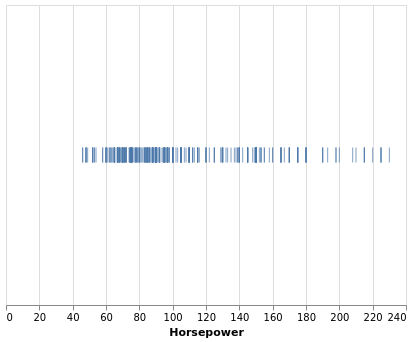

In [115]:
alt.Chart(cars).mark_tick().encode(x="Horsepower")

Comparing this to ggplot, we find that the two grammars can be mapped on each other. 

* `Chart` corresponds to `ggplot(...)`, which marks the beginning of the *sentence*
* `encode` corresponds to `aes`, which specifies the mapping of data variables to aesthetics or *channels* as they are called in    Altair
* `mark_` corresponds to `geom_`, which specifies which geometric objects to actually display

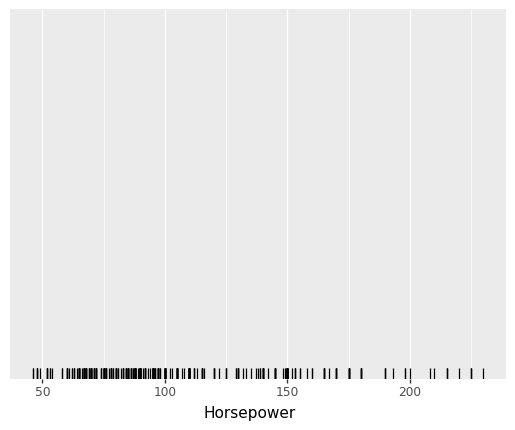

<ggplot: (8727400924501)>

In [116]:
ggplot(cars, aes(x="Horsepower")) + geom_rug()

To add other variables to the chart, we can just add new encodings. However, for a single chart we are always restricted to a single mark type.

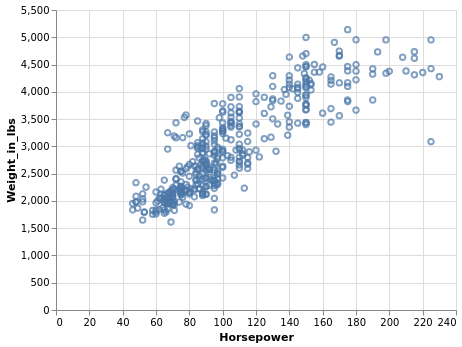

In [117]:
alt.Chart(cars).mark_point().encode(x="Horsepower", y="Weight_in_lbs")

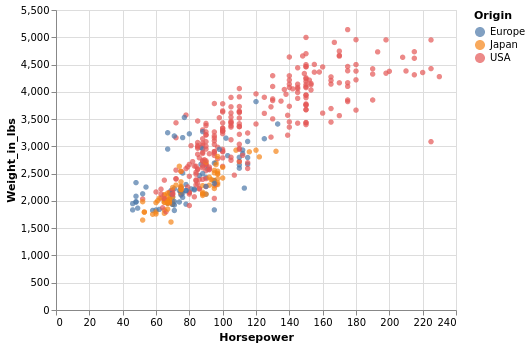

In [118]:
alt.Chart(cars).mark_circle().encode(x="Horsepower", y="Weight_in_lbs", color="Origin")

### Data types
Altair understands four different variable data types

1. nominal
1. ordinal
1. quantitative
1. temporal

It will intelligently infer the data types of the variables from the pandas data frame and use appropriate scales for mapping the variables on visual channels. However, there are times when the data types are not correctly inferred. Either because we want to use different types or because the information is not yet available. We can then use shorthand notation, suffixing the variable with the first letter of the data type, or pass the type explicitly to the constructor of the respective channel class.    

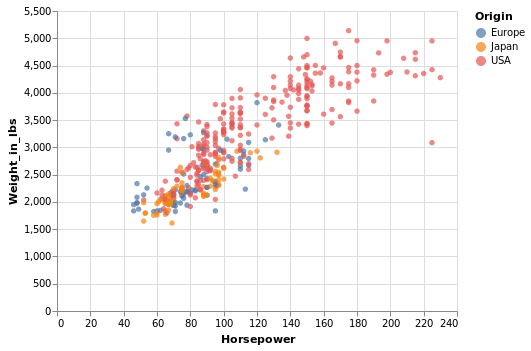

In [76]:
alt.Chart(cars).mark_circle().encode(
    x="Horsepower:Q", y="Weight_in_lbs:Q", color="Origin:N"
)

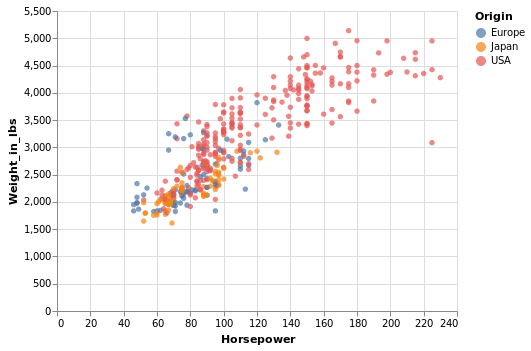

In [77]:
alt.Chart(cars).mark_circle().encode(
    x=alt.X("Horsepower", type="quantitative"),
    y=alt.Y("Weight_in_lbs", type="quantitative"),
    color=alt.Color("Origin", type="nominal"),
)

## Transformations
Because Altair is embedded in Python, we can transform data using pandas and other libraries in any way we like. However, it can be convenient or sometimes even necessary to make data transformations part of the chart specification. 

### Aggregation

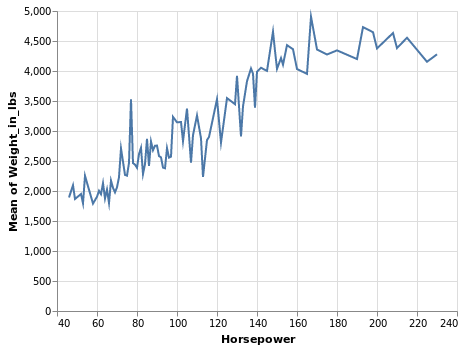

In [78]:
(alt.Chart(cars).mark_line().encode(x="Horsepower", y="mean(Weight_in_lbs)"))

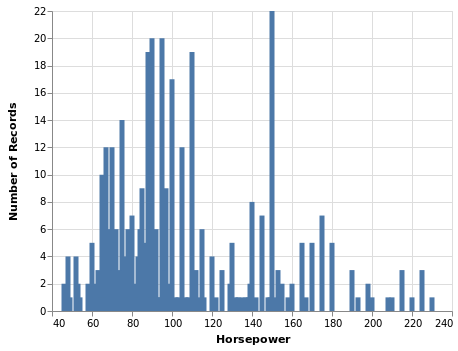

In [79]:
(alt.Chart(cars).mark_bar().encode(x="Horsepower", y="count(Horsepower)"))

In cases where the variable to be transformed is unambiguous, it is enough to only specify the transformation.

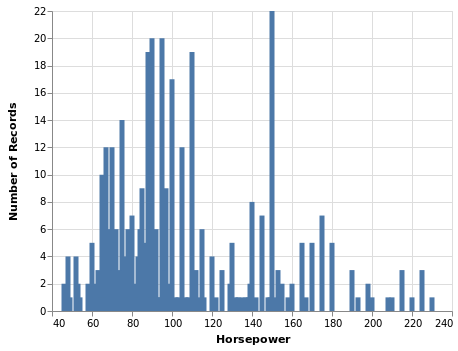

In [80]:
(alt.Chart(cars).mark_bar().encode(x="Horsepower", y="count()"))

### Binning

Now to make a histogram, we simply need to *bin* the variable on the x-axis. To do this we need to use the more verbose `alt.X` class, which allows us to pass more configuration parameters. It is a common pattern in Altair to go from the shorthands to more flexible classes, when the shorthand defaults are insufficient.  

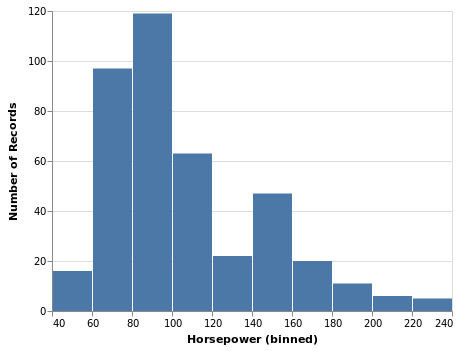

In [81]:
(alt.Chart(cars).mark_bar().encode(x=alt.X("Horsepower", bin=True), y="count()"))

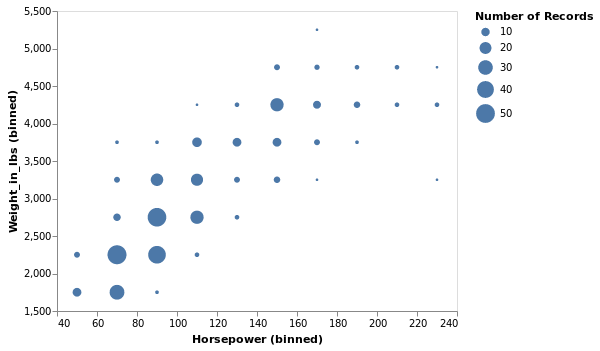

In [82]:
(
    alt.Chart(cars)
    .mark_circle()
    .encode(
        x=alt.X("Horsepower", bin=True),
        y=alt.Y("Weight_in_lbs", bin=True),
        size="count()",
    )
)

There are a whole lot of other useful transformations, that you can apply to your data. Have a look here https://altair-viz.github.io/user_guide/transform.html#user-guide-aggregate-transform.

## An algebra for combining views
ggplot is by a default a layered grammar, which provides a facet function to construct trellis plots based on data variables.
In contrast Vega-Lite provides operators to combine unit plots in arbitrary ways by using layering, vertical and horizontal concatenation. It also provides higher level operators for faceting and repetition.  

### Layering
Charts can be layered on top of each other by using the `+` operator, which forwards the arguments to `alt.layer`.

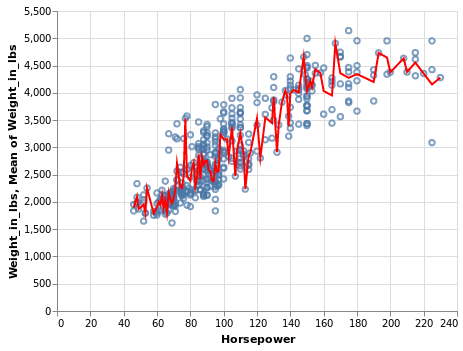

In [83]:
chart1 = alt.Chart(cars).mark_point().encode(x="Horsepower", y="Weight_in_lbs") 
chart2 = alt.Chart(cars).mark_line(color="red").encode(x="Horsepower", y="mean(Weight_in_lbs)")
chart1 + chart2

In contrast to ggplot, this seems very verbose. We can factor out common elements of the two charts into a base chart.

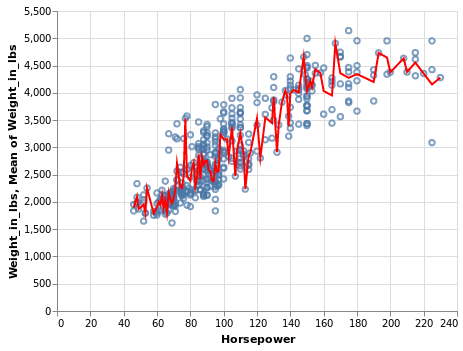

In [84]:
base = alt.Chart(cars).encode(x="Horsepower")
chart1 = base.mark_point().encode(y="Weight_in_lbs") 
chart2 = base.mark_line(color="red").encode(y="mean(Weight_in_lbs)")
chart1 + chart2

### Concatenation

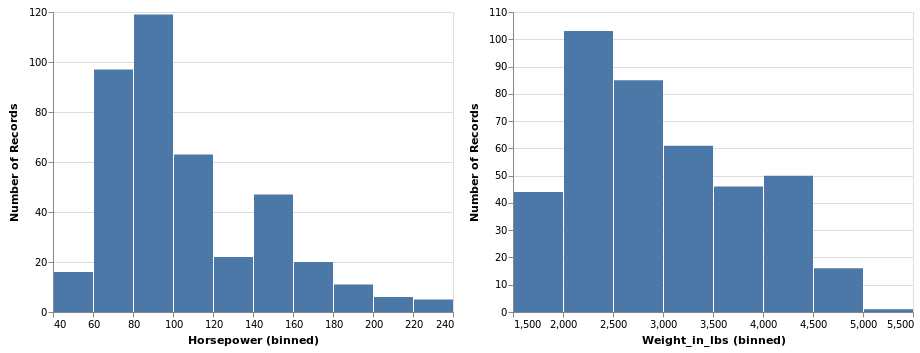

In [85]:
hist1 = (alt.Chart(cars).mark_bar().encode(x=alt.X("Horsepower", bin=True), y="count()"))
hist2 = (alt.Chart(cars).mark_bar().encode(x=alt.X("Weight_in_lbs", bin=True), y="count()"))
hist1 | hist2

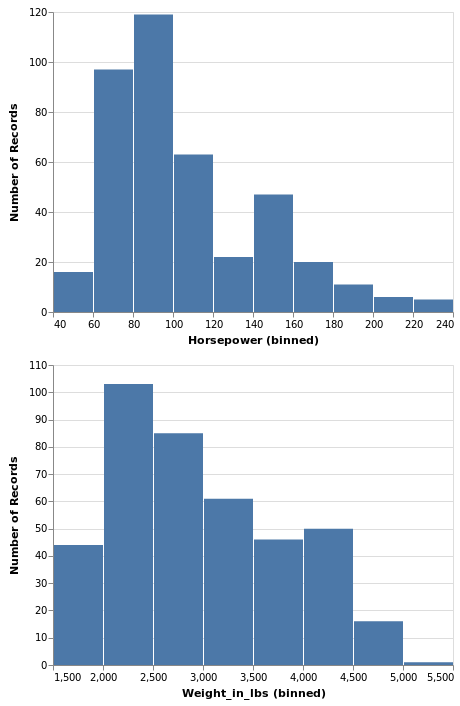

In [86]:
hist1 & hist2

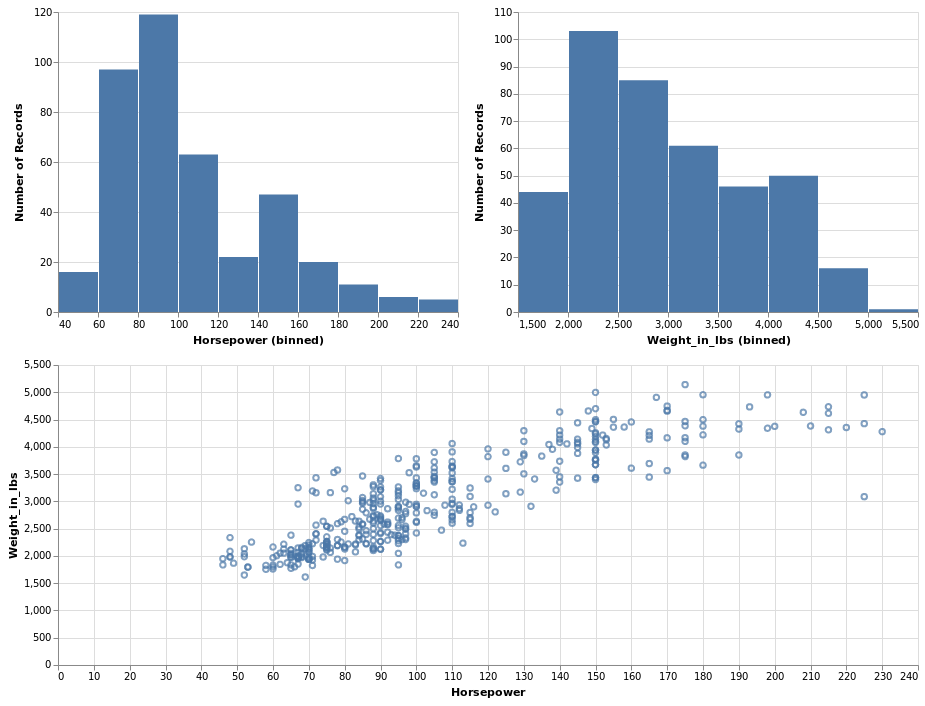

In [87]:
scatter = alt.Chart(cars, width=860).mark_point().encode(x="Horsepower", y="Weight_in_lbs") 
(hist1 | hist2) & scatter

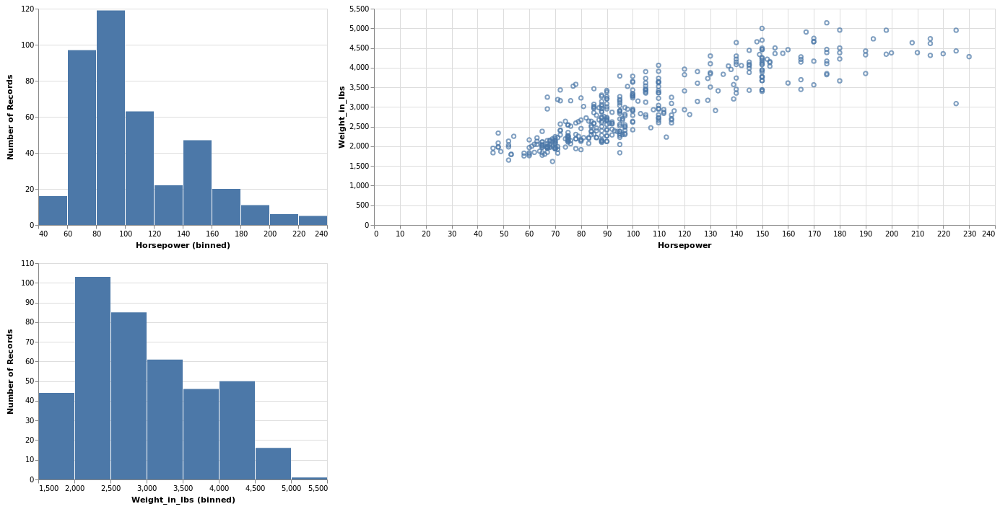

In [88]:
(hist1 & hist2) | scatter

### Repetition
Repeating charts allows us easily reuse chart specifications for a set of variables.

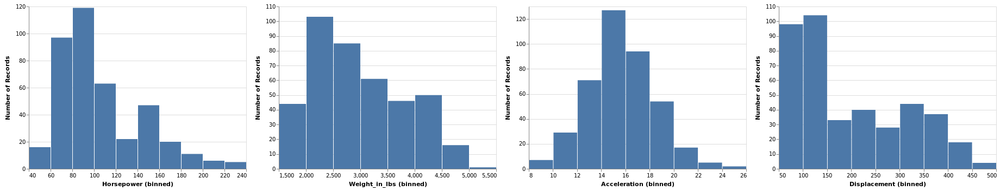

In [89]:
alt.Chart(cars).mark_bar().encode(
    x=alt.X(alt.repeat("column"), type="quantitative", bin=True),
    y="count()",
).repeat(
    column=["Horsepower", "Weight_in_lbs", "Acceleration", "Displacement"]
)

By repeating over both rows and columns, we can easily create a scatterplot matrix. The grammar is so expressive that we do not require any high level operations for doing this.

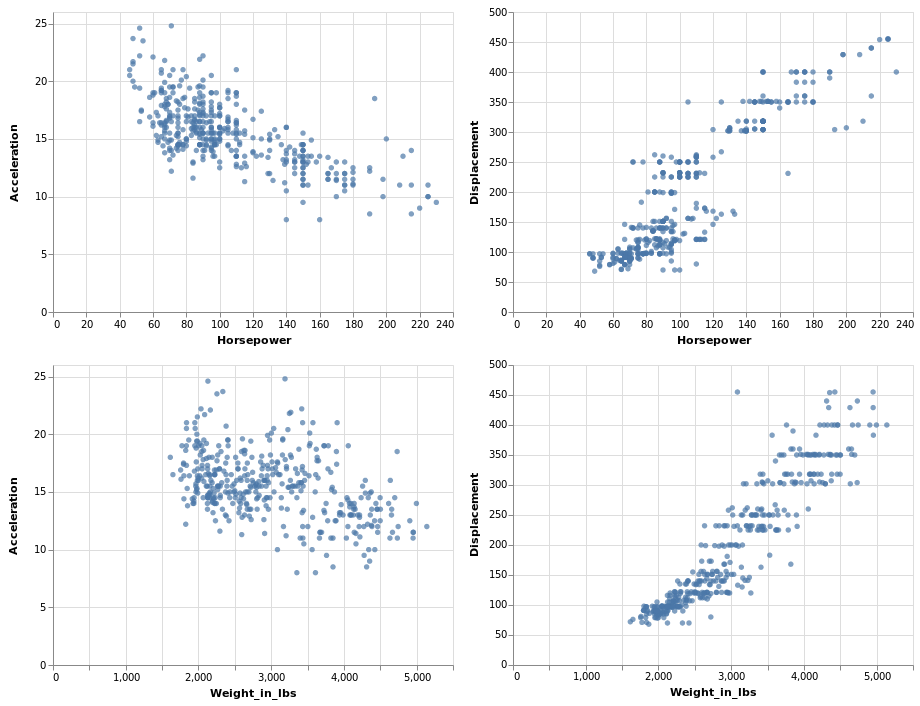

In [90]:
alt.Chart(cars).mark_circle().encode(
    x=alt.X(alt.repeat("row"), type="quantitative"),
    y=alt.Y(alt.repeat("column"), type="quantitative"),
).repeat(
    row=['Horsepower', 'Weight_in_lbs'],
    column=['Acceleration', 'Displacement'],
)

Because the Vega-Lite grammar is so modular, we can just use the same operations on a compound chart that we used on unit charts.

In [91]:
hist1 = alt.Chart(cars).mark_bar().encode(x=alt.X(alt.repeat("row"), type="quantitative"), y="count()")
hist2 = alt.Chart(cars).mark_bar().encode(x=alt.X(alt.repeat("column"), type="quantitative"), y="count()")
scatter = alt.Chart(cars, width=860).mark_point().encode(x=alt.X(alt.repeat("row"), type="quantitative"), y=alt.Y(alt.repeat("column"), type="quantitative")) 
compound = (hist1 | hist2) & scatter

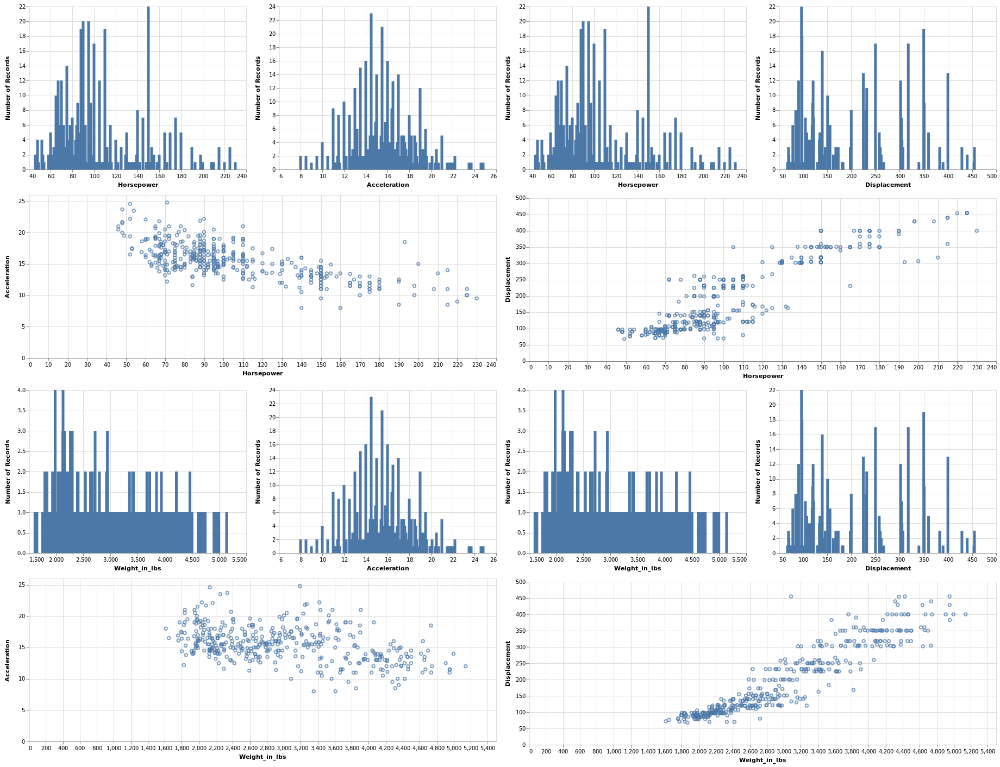

In [92]:
compound.repeat(
    row=['Horsepower', 'Weight_in_lbs'],
    column=['Acceleration', 'Displacement'],
)

### Faceting
Faceting works as usual. We put a categorical variable on either `column` or `row` and the one chart for each subset is created.

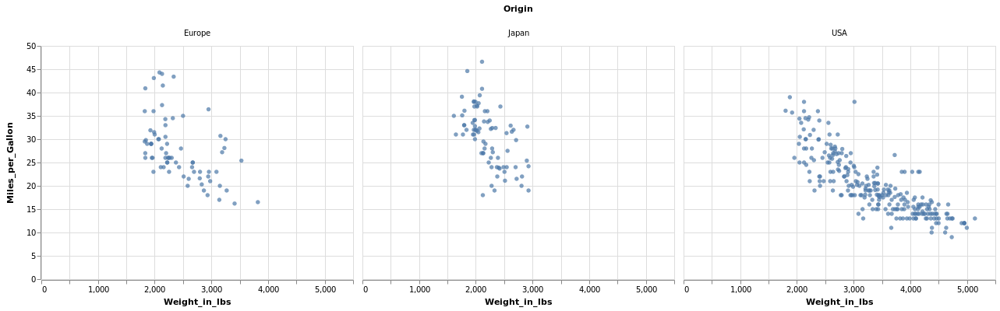

In [93]:
alt.Chart(cars).mark_circle().encode(
    x="Weight_in_lbs",
    y="Miles_per_Gallon",
).facet(
    column="Origin"
)

## The new dimensions of interactivity
The greatest innovation in Vega-Lite in contrast to traditional grammars of graphics, is that it adds elements for interactivity. This gives us a bunch of whole new dimensions to map our data on, so that we can better explore the relationships in our dataset. 

[Yi *et al.*](https://files.t-square.gatech.edu/access/content/attachment/d2bd0a94-b123-43e5-9f08-bf3545ec7bf1/TowardADeeperUnderstandingOfTheRoleofInteractionInInformationVisualization.pdf) provides a taxonomy of visual interaction techniques. We will go through this taxonomy and see how it can be instantiated in Altair. 

### Explore: show me something else
The simplest way to add interactivity to a chart is by simply calling `interactive()` on it. This enables zooming and panning. 

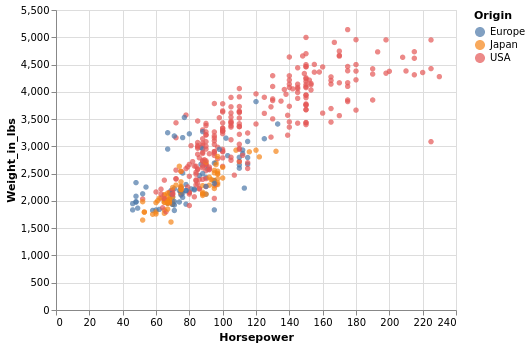

In [119]:
alt.Chart(cars).mark_circle().encode(
    x="Horsepower", 
    y="Weight_in_lbs", 
    color="Origin"
).interactive()


### Select: mark something as interesting
A selection highlights points of interest. This is especially useful in combination with exploration interactions enabled.

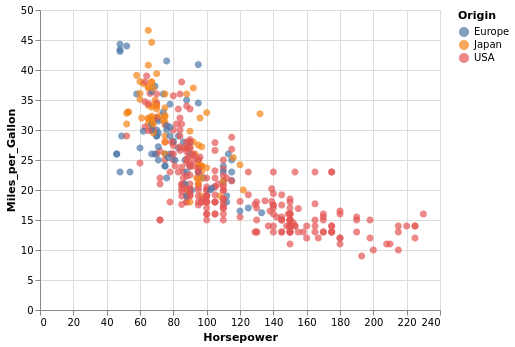

In [120]:
selection = alt.selection_single()

alt.Chart(cars).mark_circle(size=50).encode(
    x='Horsepower:Q',
    y='Miles_per_Gallon:Q',
    color=alt.condition(selection, 'Origin', alt.value('lightgray'))
).properties(
    selection=selection
).interactive()

### Abstract/Elaborate: show me more or less detail
Combining an overview and a detail view side by side is useful for discovering patters in the whole dataset and then immediately inspecting them in detail.

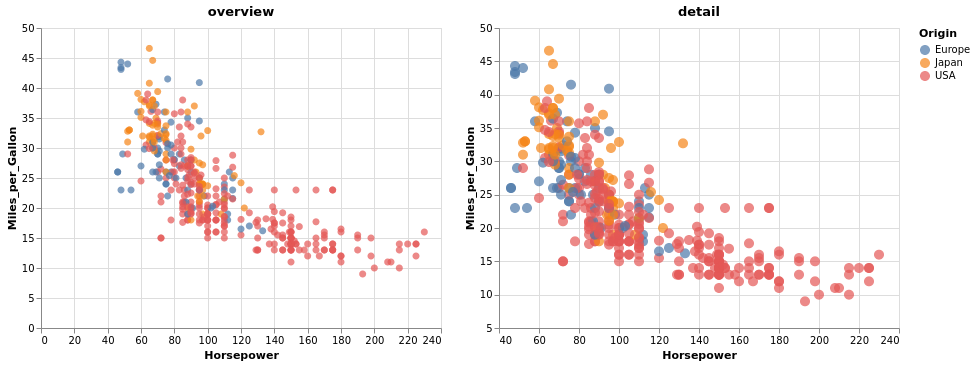

In [121]:
selectionx = alt.selection_interval(encodings=["x"])
selectiony = alt.selection_interval(encodings=["y"])

overview = (
    alt.Chart(cars, title="overview")
    .mark_circle(size=50)
    .encode(
        x="Horsepower:Q",
        y="Miles_per_Gallon:Q",
        color=alt.condition(selectionx & selectiony, "Origin", alt.value("lightgray")),
    )
    .add_selection(selectionx)
    .add_selection(selectiony)
)

detail = (
    alt.Chart(cars, title="detail")
    .mark_circle(size=100)
    .encode(
        x=alt.X("Horsepower:Q", scale=alt.Scale(domain=selectionx.ref())),
        y=alt.Y("Miles_per_Gallon:Q", scale=alt.Scale(domain=selectiony.ref())),
        color="Origin",
        tooltip="Name",
    )
)

overview | detail

### Connect: show me related items
Highlighting related items can be done connecting identical items across view or by highlighting related items, e.g. groups, within the same view.

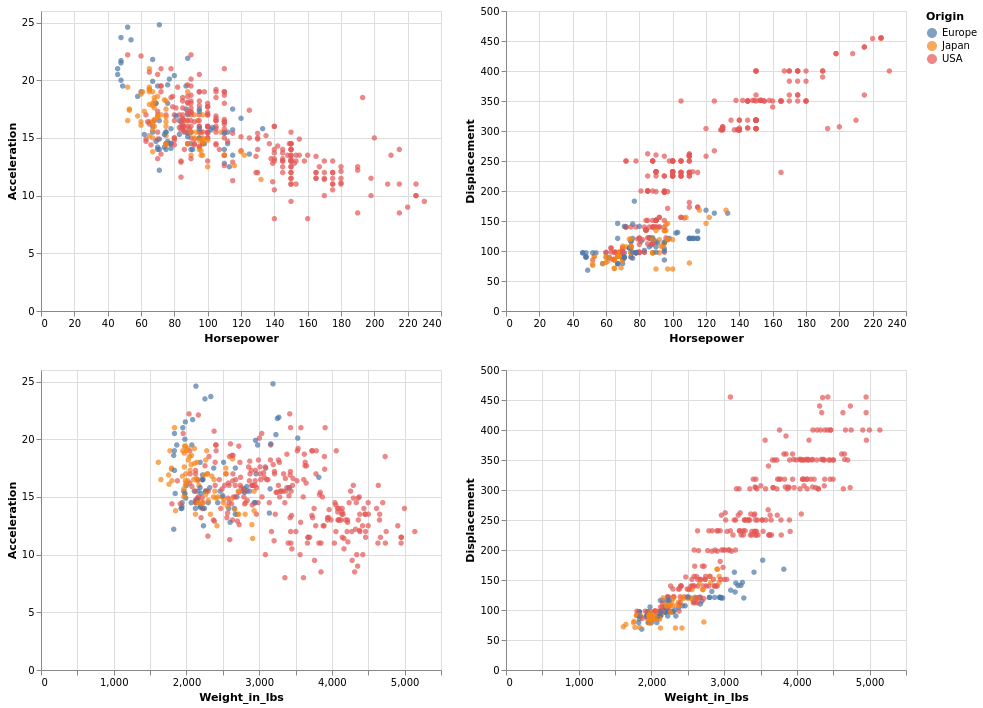

In [122]:
brush = alt.selection(type="interval")

alt.Chart(cars).mark_circle().encode(
    x=alt.X(alt.repeat("row"), type="quantitative"),
    y=alt.Y(alt.repeat("column"), type="quantitative"),
    color=alt.condition(brush, "Origin:N", alt.value("lightgray")),
).add_selection(brush).repeat(
    row=["Horsepower", "Weight_in_lbs"], column=["Acceleration", "Displacement"]
)

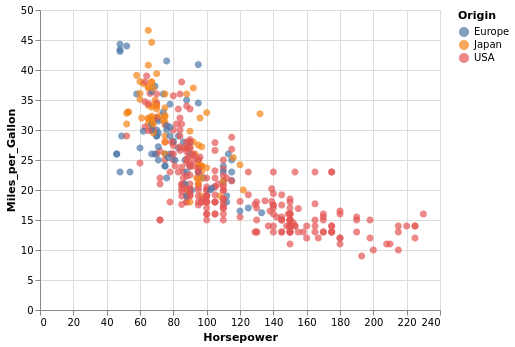

In [123]:
selection = alt.selection_multi(fields=["Origin"])

alt.Chart(cars).mark_circle(size=50).encode(
    x="Horsepower:Q",
    y="Miles_per_Gallon:Q",
    color=alt.condition(selection, "Origin", alt.value("lightgray")),
).properties(selection=selection)

### Filter: show me something conditionally
Filtering is a powerful technique, as it allows us to view arbitrary subgroups of our dataset in a new context.

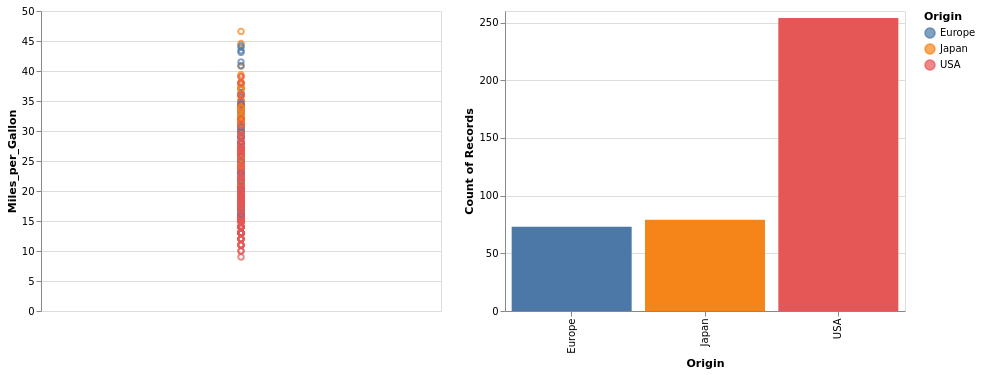

In [166]:
brush = alt.selection(type="interval")

points = (
    alt.Chart()
    .mark_point()
    .encode(
        y="Miles_per_Gallon:Q",
        color=alt.condition(brush, "Origin:N", alt.value("lightgray")),
    )
    .add_selection(brush)
)

bars = (
    alt.Chart()
    .mark_bar()
    .encode(x="Origin:N", y="count(Origin):Q", color="Origin:N")
    .transform_filter(brush)
)

alt.hconcat(points, bars, data=cars)

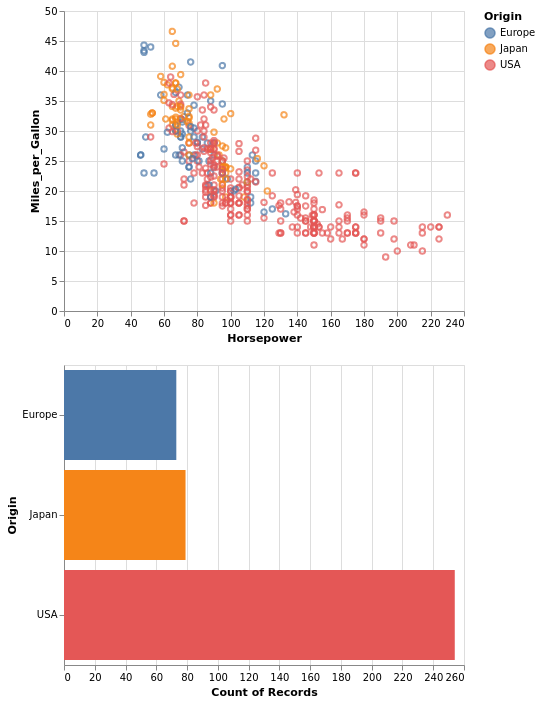

In [167]:
brush = alt.selection(type="interval")

points = (
    alt.Chart(cars)
    .mark_point()
    .encode(
        x="Horsepower:Q",
        y="Miles_per_Gallon:Q",
        color=alt.condition(brush, "Origin:N", alt.value("lightgray")),
    )
    .add_selection(brush)
)

bars = (
    alt.Chart(cars)
    .mark_bar()
    .encode(y="Origin:N", color="Origin:N", x="count(Origin):Q")
    .transform_filter(brush)
)

points & bars

For more interactive plots see https://altair-viz.github.io/user_guide/interactions.html

## Exporting plots to the web

In [168]:
(points & bars).save("plot.html")

In [127]:
import vega_datasets
from plotnine import *
cars = vega_datasets.data.cars()
cars = cars.fillna(cars.median())
cars.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [128]:
with open("cars.json", "w") as f:
    f.write(cars.to_json(orient="records"))

# Further Readings
Jake VanderPlas talking about all of Python's plotting libraries that you might ever want to use. (https://youtu.be/FytuB8nFHPQ)

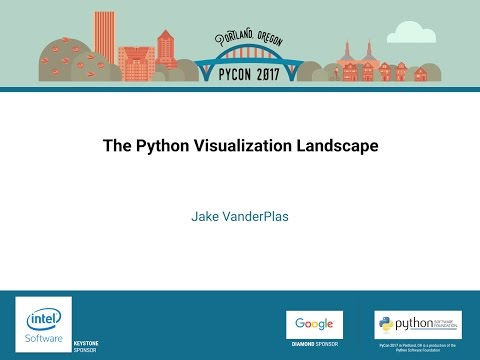

In [46]:
from IPython.display import YouTubeVideo
YouTubeVideo('FytuB8nFHPQ')

A tutorial on exploratory data analysis using pandas, matplotlib and seaborn. (https://youtu.be/KvZ2KSxlWBY)

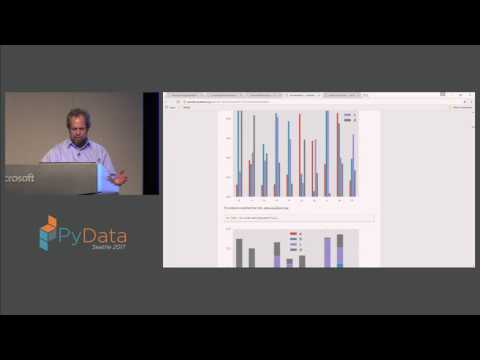

In [47]:
YouTubeVideo('KvZ2KSxlWBY')

Jake VanderPlas' full tutorial on Altair (https://youtu.be/ms29ZPUKxbU ). The tutorial notebooks can be found at https://github.com/altair-viz/altair-tutorial.

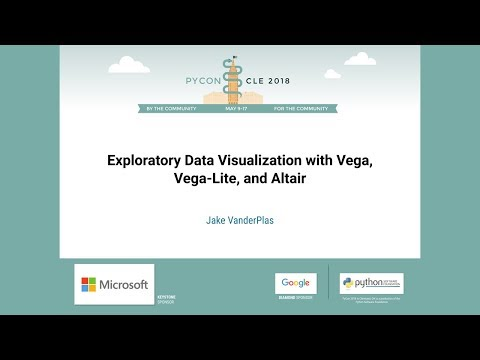

In [1]:
from IPython.display import YouTubeVideo

YouTubeVideo("ms29ZPUKxbU")

The conference talk about Voyager 2 (https://youtu.be/nrnN0l3rjdk ):

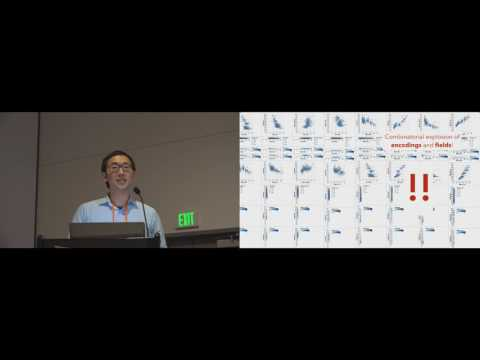

In [2]:
YouTubeVideo("nrnN0l3rjdk")

The original papers one Vega-Lite (https://idl.cs.washington.edu/papers/vega-lite/) and Voyager version 1 (https://idl.cs.washington.edu/papers/voyager/) and 2 (https://idl.cs.washington.edu/papers/voyager2/) that highlight the thoughts behind the design of these tools. 